## 数据清洗

In [1]:
import pandas as pd 
import numpy as np

In [13]:
df = pd.read_excel('./数据/Online Retail.xlsx')
df.sample(9)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
173197,551658,22411,JUMBO SHOPPER VINTAGE RED PAISLEY,10,2011-05-03 12:13:00,2.08,16746.0,United Kingdom
385040,570187,22703,PINK CAT BOWL,1,2011-10-07 15:09:00,1.63,NaN,United Kingdom
189647,553162,22192,BLUE DINER WALL CLOCK,6,2011-05-13 15:53:00,16.63,NaN,United Kingdom
165537,550806,47591D,PINK FAIRY CAKE CHILDRENS APRON,8,2011-04-20 15:44:00,1.95,14334.0,United Kingdom
440950,574555,84792,ENCHANTED BIRD COATHANGER 5 HOOK,1,2011-11-04 15:29:00,4.65,16426.0,United Kingdom
80137,543022,22697,GREEN REGENCY TEACUP AND SAUCER,3,2011-02-02 14:37:00,2.95,16771.0,United Kingdom
114405,546008,20707,CRAZY DAISY HEART DECORATION,1,2011-03-08 15:43:00,0.83,NaN,United Kingdom
531515,580956,15044C,PURPLE PAPER PARASOL,1,2011-12-06 14:23:00,2.95,17841.0,United Kingdom
312762,564372,23287,RED VINTAGE SPOT BEAKER,16,2011-08-25 09:55:00,0.85,12714.0,France


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [15]:
df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [16]:
df[['Quantity', 'UnitPrice']].describe()

,Quantity,UnitPrice
count,541909.000000,541909.000000
mean,9.552250,4.611114
std,218.081158,96.759853
min,-80995.000000,-11062.060000
25%,1.000000,1.250000
50%,3.000000,2.080000
75%,10.000000,4.130000
max,80995.000000,38970.000000


In [41]:
df_clean = df.dropna(subset=['CustomerID'])

df_clean


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [42]:
len(df_clean)

406829

In [45]:
df_clean.isna().sum()


InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [46]:
# 过滤 Quantity 为负数的记录（退货订单单独分析）
# 注意：退货需关联原始订单，此处仅保留正常销售记录
df_clean = df_clean[df_clean['Quantity'] > 0]

# 过滤异常价格（如 UnitPrice <=0 或极端高价）
df_clean = df_clean[(df_clean['UnitPrice'] > 0) & (df_clean['UnitPrice'] < 1000)]

# 检查清洗后的统计摘要
print("\n清洗后数值字段统计摘要：")
print(df_clean[['Quantity', 'UnitPrice']].describe())


清洗后数值字段统计摘要：
            Quantity      UnitPrice
count  397863.000000  397863.000000
mean       12.988871       2.989297
std       179.336487       6.994518
min         1.000000       0.001000
25%         2.000000       1.250000
50%         6.000000       1.950000
75%        12.000000       3.750000
max     80995.000000     908.160000


In [47]:
# 标记退货订单（InvoiceNo以'C'开头）
df_clean['IsReturn'] = df_clean['InvoiceNo'].astype(str).str.startswith('C')

# 可选：将退货订单单独存储（用于后续分析）
df_returns = df_clean[df_clean['IsReturn']]

# 仅保留正常销售订单（若需排除退货）
df_sales = df_clean[~df_clean['IsReturn']]

In [48]:
# 删除完全重复的行
df_clean = df_clean.drop_duplicates()

In [49]:
# 转换 InvoiceDate 为 datetime 类型
df_clean['InvoiceDate'] = pd.to_datetime(df_clean['InvoiceDate'])

df_clean.sample(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,IsReturn
201233,554275,21755,LOVE BUILDING BLOCK WORD,2,2011-05-23 13:17:00,5.95,14903.0,United Kingdom,False
422258,573074,46000S,POLYESTER FILLER PAD 40x40cm,4,2011-10-27 14:03:00,1.45,16265.0,United Kingdom,False
293300,562593,85123A,WHITE HANGING HEART T-LIGHT HOLDER,9,2011-08-07 15:43:00,2.95,16549.0,United Kingdom,False
408972,572035,22667,RECIPE BOX RETROSPOT,48,2011-10-20 12:03:00,2.55,14646.0,Netherlands,False
448391,575051,22810,SET OF 6 T-LIGHTS SNOWMEN,6,2011-11-08 12:14:00,2.95,15957.0,United Kingdom,False
326455,565541,84509A,SET OF 4 ENGLISH ROSE PLACEMATS,1,2011-09-05 12:00:00,3.75,14159.0,United Kingdom,False
99759,544788,20669,RED HEART LUGGAGE TAG,12,2011-02-23 12:18:00,1.25,13089.0,United Kingdom,False
154686,549939,21198,WHITE HEART CONFETTI IN TUBE,12,2011-04-13 11:46:00,1.65,16309.0,United Kingdom,False
347602,567312,23215,JINGLE BELL HEART ANTIQUE SILVER,12,2011-09-19 13:47:00,2.08,15500.0,United Kingdom,False
74463,542428,22530,MAGIC DRAWING SLATE DOLLY GIRL,192,2011-01-28 10:00:00,0.42,17404.0,Sweden,False


In [50]:
# 保存为新的 CSV 文件
df_clean.to_csv('Online_Retail_Clean.csv', index=False)
print("\n清洗后的数据已保存为 'Online_Retail_Clean.csv'")


清洗后的数据已保存为 'Online_Retail_Clean.csv'


## 销售额分析

In [1]:
pip install duckdb

   ---------------------------------------- 11.4/11.4 MB 2.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


### 销售额趋势

In [2]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import duckdb
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

In [6]:
df = pd.read_csv(
    './Online_Retail_Clean.csv',
    parse_dates=['InvoiceDate'],  # 强制解析日期字段！
    dtype={'InvoiceNo': str}       # 保持InvoiceNo为字符串
)

query_step1 = '''
SELECT 
  strftime(
    CAST(InvoiceDate AS TIMESTAMP),  -- ✅ 显式类型转换！
    '%Y-%m'
  ) AS Month,
  SUM(UnitPrice * Quantity) AS TotalSales
FROM df
WHERE 
  Quantity > 0 
  AND NOT (InvoiceNo LIKE 'C%')
GROUP BY Month
ORDER BY Month;
'''

df_step1 = duckdb.sql(query_step1).to_df()
df_step1

,Month,TotalSales
0,2010-12,570422.730
1,2011-01,568101.310
2,2011-02,446084.920
3,2011-03,590707.420
4,2011-04,459681.231
5,2011-05,666728.440
6,2011-06,660046.050
7,2011-07,598962.901
8,2011-08,641551.040
9,2011-09,948657.102


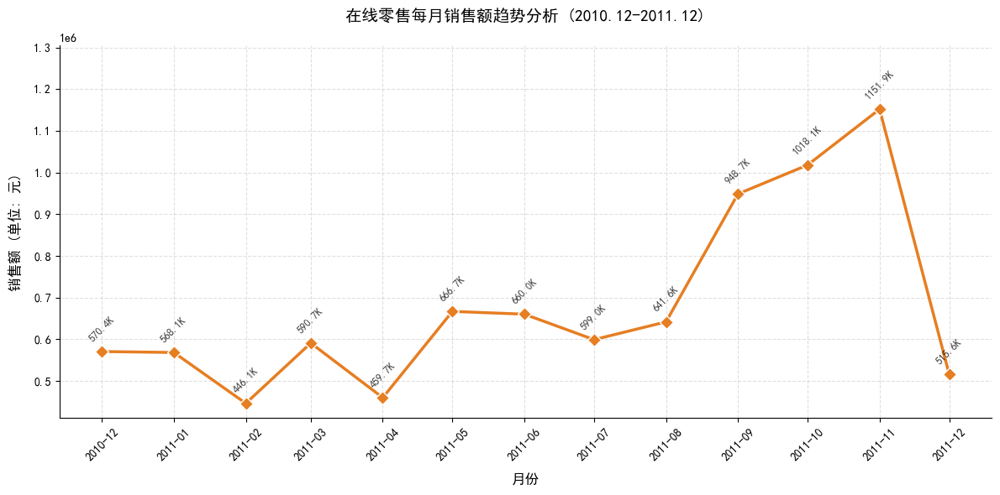

In [7]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

def plot_sales_trend(df, figsize=(12,6), title='月度销售额趋势分析', 
                    line_color='#2E86C1', marker='o', grid_alpha=0.3):
    """
    绘制月度销售额折线图
    
    参数：
        df        : 必需含 'Month'(YYYY-MM格式) 和 'TotalSales' 列的DataFrame
        figsize   : 图表尺寸，默认(12,6)
        title     : 标题，支持中文
        line_color: 折线颜色，支持HEX/RGB/颜色名称
        marker    : 数据点样式，默认圆形 ('o')，设为None可隐藏
        grid_alpha: 网格线透明度（0为透明，1为不透明）
    """
    # ✅ 预处理数据（确保日期排序正确）
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Month'])  # 转为datetime类型保证排序
    df.sort_values('Date', inplace=True)
    
    plt.figure(figsize=figsize)
    ax = plt.gca()
    
    # 绘制折线
    sns.lineplot(
        data=df, x='Date', y='TotalSales',
        marker=marker, color=line_color, 
        linewidth=2.5, markersize=8,
        markeredgecolor='white', markeredgewidth=1
    )
    
    # 添加数据标签（动态旋转角度防止重叠）
    for idx, row in df.iterrows():
        ax.text(
            row['Date'], row['TotalSales'] + 20000,  # 文字位置微调
            f"{row['TotalSales']/1000:.1f}K",       # 自动转K显示
            ha='center', va='bottom', 
            rotation=45 if len(df) > 12 else 0,      # 月份多则倾斜标签
            fontsize=9, alpha=0.75
        )
    
    # ✅ 高级日期轴格式化
    locator = mdates.MonthLocator(interval=1)  # 每月显示刻度
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    
    # 美化样式
    plt.title(title, fontsize=14, pad=20, fontweight='bold')
    plt.xlabel('月份', fontsize=12, labelpad=10)
    plt.ylabel('销售额 ', fontsize=12, labelpad=10)
    plt.grid(True, linestyle='--', alpha=grid_alpha)
    plt.xticks(rotation=45)  # 统一旋转防止重叠
    
    # 智能Y轴范围调整（留出顶部空间）
    ymin, ymax = ax.get_ylim()
    ax.set_ylim(ymin, ymax*1.1)  # 上方留10%空位
    
    sns.despine()  # 去除多余边框
    plt.tight_layout()
    plt.show()

# ▶️ 调用函数 (一步生成专业图表)
plot_sales_trend(
    df_step1, 
    title='在线零售每月销售额趋势分析 (2010.12-2011.12)',
    line_color='#E67E22',      # 修改为橙色
    marker='D',                # 菱形标记点
    grid_alpha=0.4
)


### 热门产品

In [9]:
query_step2 = """
        
SELECT 
  StockCode,
  Description,
  SUM(Quantity) AS TotalQuantitySold,
  SUM(UnitPrice * Quantity) AS TotalRevenue
FROM df
WHERE Quantity > 0 
GROUP BY StockCode, Description  -- 必须包含所有非聚合字段!!
ORDER BY TotalQuantitySold DESC  -- 使用别名排序
LIMIT 10;

-- 2. 如果还需要按销售额排序添加新查询（不能直接接在前一条语句末尾）
SELECT 
  StockCode,
  Description,
  SUM(Quantity) AS TotalQuantitySold,
  SUM(UnitPrice * Quantity) AS TotalRevenue
FROM df
WHERE Quantity > 0 
GROUP BY StockCode, Description 
ORDER BY TotalRevenue DESC  -- 修改排序字段为销售额
LIMIT 10;

"""
df_step2 = duckdb.sql(query_step2).to_df()
df_step2


,StockCode,Description,TotalQuantitySold,TotalRevenue
0,23843,"PAPER CRAFT , LITTLE BIRDIE",80995.0,168469.60
1,22423,REGENCY CAKESTAND 3 TIER,12374.0,142264.75
2,85123A,WHITE HANGING HEART T-LIGHT HOLDER,36706.0,100392.10
3,85099B,JUMBO BAG RED RETROSPOT,46078.0,85040.54
4,23166,MEDIUM CERAMIC TOP STORAGE JAR,77916.0,81416.73
5,POST,POSTAGE,3119.0,69661.21
6,47566,PARTY BUNTING,15279.0,68785.23
7,84879,ASSORTED COLOUR BIRD ORNAMENT,35263.0,56413.03
8,23084,RABBIT NIGHT LIGHT,27153.0,51251.24
9,79321,CHILLI LIGHTS,9646.0,46265.11


### 国家贡献

In [11]:
query_step3 = """
        WITH CountrySales AS (
 SELECT 
   Country,
   SUM(UnitPrice * Quantity) AS Sales,
   SUM(SUM(UnitPrice * Quantity)) OVER() AS GlobalSales  -- 总销售额
 FROM df
 GROUP BY Country
)
SELECT 
 Country,
 Sales,
 Sales * 100.0 / GlobalSales AS Percentage,
 SUM(Sales) OVER(ORDER BY Sales DESC) / GlobalSales AS CumulativePercentage
FROM CountrySales
ORDER BY Sales DESC;
"""
df_step3 = duckdb.sql(query_step3).to_df()
df_step3


,Country,Sales,Percentage,CumulativePercentage
0,United Kingdom,7.261429e+06,82.175029,0.821750
1,Netherlands,2.854463e+05,3.230296,0.854053
2,EIRE,2.618881e+05,2.963696,0.883690
3,Germany,2.286784e+05,2.587873,0.909569
4,France,1.994759e+05,2.257398,0.932143
5,Australia,1.384538e+05,1.566833,0.947811
6,Spain,6.155856e+04,0.696637,0.954778
7,Switzerland,5.644395e+04,0.638756,0.961165
8,Belgium,4.119634e+04,0.466204,0.965827
9,Sweden,3.836783e+04,0.434195,0.970169


## 客户分析

### RMF客户分群

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# 加载清洗后的数据（假设文件名为 'Online_Retail_Clean.csv'）
df = pd.read_csv('Online_Retail_Clean.csv', parse_dates=['InvoiceDate'])
print("数据前5行：")
df.head()

数据前5行：


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,IsReturn
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,False
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,False
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False


In [9]:
# 设定当前日期（假设数据最新日期为分析日期）
current_date = df['InvoiceDate'].max() + pd.DateOffset(days=1)

# 计算每个客户的 RFM 值
rfm = df.groupby('CustomerID').agg({
    'InvoiceDate': lambda x: (current_date - x.max()).days,  # Recency（最近一次消费距今天数）
    'InvoiceNo': 'nunique',                                   # Frequency（消费次数）
    'UnitPrice': lambda x: (x * df.loc[x.index, 'Quantity']).sum()  # Monetary（总消费金额）
}).reset_index()

# 重命名列
rfm.columns = ['CustomerID', 'Recency', 'Frequency', 'Monetary']
print("\nRFM 数据示例：")
rfm.head()


RFM 数据示例：


,CustomerID,Recency,Frequency,Monetary
0,12346.0,326,1,77183.60
1,12347.0,2,7,4310.00
2,12348.0,75,4,1797.24
3,12349.0,19,1,1757.55
4,12350.0,310,1,334.40


In [10]:
print("【检查Frequency阈值】")
print(rfm['Frequency'].value_counts().sort_index())
print("\n【观察Monetary分位点】")
print(rfm['Monetary'].quantile([0.25,0.5,0.75,1.0]))

【检查Frequency阈值】
Frequency
1      1493
2       836
3       506
4       388
5       243
6       172
7       142
8        98
9        69
10       53
11       54
12       45
13       28
14       20
15       28
16       11
17       18
18       14
19       12
20       12
21       11
22        5
23        5
24        3
25        8
26        7
27        3
28        6
29        1
30        4
31        3
32        3
33        2
34        3
35        1
37        3
38        2
39        2
41        1
44        1
45        1
46        1
47        2
48        1
50        1
51        1
55        2
57        1
60        1
62        2
73        1
86        1
91        1
93        1
97        1
124       1
199       1
209       1
Name: count, dtype: int64

【观察Monetary分位点】
0.25       306.46
0.50       668.56
0.75      1654.31
1.00    280206.02
Name: Monetary, dtype: float64


In [19]:
rfm['R_Score'] = pd.qcut(rfm['Recency'], q=4, labels=range(4,0,-1), duplicates='drop')
# 针对Frequency定制分箱边界（单位：购买次数）
frequency_bins = [0, 1, 3, 8, np.inf]  # 左开右闭区间
frequency_labels = ['低活跃', '次活跃', '一般活跃', '高活跃']

rfm['F_Score'] = pd.cut(
    rfm['Frequency'],
    bins=frequency_bins,
    labels=range(1,5),  # 此处用数字标签是为了后续RFM总分计算
    right=True,          # 右侧闭合：例如 (1,3] 包括3
    include_lowest=False # (0,1] => 不包含0，但第一个箱的起始是0.0
)


In [20]:
# 先对Monetary取对数（缩小极差值）
rfm['Monetary_log'] = np.log10(rfm['Monetary'] + 1e-5)  # 避免0值无法取对数

# 命中分布的分位数（调整后）
quantiles = rfm['Monetary_log'].quantile([0.25, 0.5, 0.75, 1.0])
print("转换后分位数:")
print(quantiles)

# 将信息转换为实际货币分箱边界（逆转换）
actual_bins = [0] + [10**q for q in quantiles.iloc[:-1]] + [rfm['Monetary'].max()]
print("\n实际分箱边界(Monetary原始值):")
print([round(b,2) for b in actual_bins])

# 执行分箱
rfm['M_Score'] = pd.cut(
    rfm['Monetary'],
    bins=actual_bins,
    labels=range(1,5),
    include_lowest=True  # 包含最小值？
) #需要根据默认值进行调整

rfm.head()

转换后分位数:
0.25    2.486374
0.50    2.825140
0.75    3.218617
1.00    5.447477
Name: Monetary_log, dtype: float64

实际分箱边界(Monetary原始值):
[0, 306.46, 668.56, 1654.31, np.float64(280206.02)]


,CustomerID,Recency,Frequency,Monetary,F_Score,Monetary_log,M_Score,R_Score
0,12346.0,326,1,77183.60,1,4.887525,4,1
1,12347.0,2,7,4310.00,3,3.634477,4,4
2,12348.0,75,4,1797.24,3,3.254606,4,2
3,12349.0,19,1,1757.55,1,3.244908,4,3
4,12350.0,310,1,334.40,1,2.524266,2,1


In [22]:
print("\n👉 验证分箱覆盖情况(Frequency)：")
print(rfm['F_Score'].value_counts().sort_index())

print("\n👉 查看Monetary分箱边界有效性：")
print(rfm.groupby('M_Score')['Monetary'].agg(['min','max','count']).round(2))



👉 验证分箱覆盖情况(Frequency)：
F_Score
1    1493
2    1342
3    1043
4     459
Name: count, dtype: int64

👉 查看Monetary分箱边界有效性：
             min        max  count
M_Score                           
1           3.75     306.46   1085
2         306.55     668.56   1084
3         668.58    1654.31   1084
4        1657.28  280206.02   1084


C:\Users\yczlw\AppData\Local\Temp/ipykernel_33564/2458126141.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(rfm.groupby('M_Score')['Monetary'].agg(['min','max','count']).round(2))


In [28]:
# Python 条件筛选实现示例
conditions = [
    (rfm['R_Score'] >=4) & (rfm['F_Score']==4) & (rfm['M_Score']==4),  # 至尊VIP
    ((rfm['F_Score'] <=2) | (rfm['M_Score'] <=2)) & (rfm['R_Score'] >=4),  # 高潜力客户  
    (rfm['R_Score'] >=3) & (rfm['M_Score'] >=3) & (rfm['F_Score'] >=3),  # 常规忠诚客户
    (rfm['R_Score'] <=2) & (rfm['F_Score'] >=3) & (rfm['M_Score'] >=3),  # 沉睡用户
    (rfm['R_Score'] <=2) & ((rfm['F_Score'] <=2) | (rfm['M_Score'] <=2)),  # 流失风险
    (rfm['F_Score'] ==1) | ((rfm['F_Score'] >1) & (rfm['M_Score']==1) & (rfm['R_Score'] <=3))  # 长尾低频
]

groups = ["至尊VIP", "高潜力客户", "常规忠诚客户", "沉睡用户", "流失风险客户", "长尾低频客户"]

rfm['客户层级'] = np.select(conditions, groups, default='其他未归类客户')
rfm.to_csv('rfm_segments.csv')

In [25]:
# 统计各群体人数
segmented = rfm['客户层级'].value_counts().reset_index()
segmented.columns = ['客户层级', '人数']
segmented['占比'] = (segmented['人数'] / segmented['人数'].sum() *100).round(1)

segmented


,客户层级,人数,占比
0,高潜力客户,2932,67.6
1,常规忠诚客户,556,12.8
2,至尊VIP,437,10.1
3,沉睡用户,412,9.5


In [34]:
pip install plotly

   ---------------------------------------- 14.8/14.8 MB 4.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [26]:
from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from wordcloud import WordCloud
import plotly.express as px  # 使用Plotly生成动态图表


def visualize_customer_segments(df, fig_format='interactive', top_n=8):
    """
    客户分群分布的可视化驾驶舱
    
    参数:
        df          : 必须包含 ['客户层级', 'count'] 的聚合DataFrame
        fig_format  : 图表输出格式 ('interactive'动态 | 'static'静态)
        top_n       : 显示占比前N的细分群组(其余归为'其他')
    """
    # 预处理: 计算占比并合并长尾群组
    grouped = df['客户层级'].value_counts().reset_index()
    grouped.columns = ['客户层级', '人数']
    grouped['占比'] = grouped['人数'] / grouped['人数'].sum()

    # 合并长尾群组（提升可读性）
    if top_n < len(grouped):
        main_groups = grouped.nlargest(top_n, '人数')
        others_count = grouped['人数'].sum() - main_groups['人数'].sum()
        others_row = pd.DataFrame([['其他客户群', others_count, others_count/grouped['人数'].sum()]], 
                                columns=grouped.columns)
        grouped = pd.concat([main_groups, others_row])

    # 智能配色方案（根据业务语义优化）
    color_dict = {
        '至尊VIP': '#FF6B6B',          # 高光红色
        '常规忠诚客户': '#4ECDC4',      # 信任感的青绿色
        '高潜力客户': '#FFD93D',        # 充满希望的亮黄色
        '沉睡用户': '#6C5B7B',          # 神秘紫色代表休眠
        '流失风险客户': '#FF6B6B',      # 警示红色
        '长尾低频客户': '#A8D8EA',      # 冷色系
        '其他客户群': '#D3D3D3'        # 中性灰
    }
    colors = [color_dict.get(g, '#808080') for g in grouped['客户层级']]

    if fig_format == 'interactive':
        # 生成交互式旭日图 (需要安装 plotly: pip install plotly)
        fig = px.sunburst(
            grouped, 
            path=['客户层级'], 
            values='人数',
            color='客户层级', 
            color_discrete_map=color_dict,
            title='客户分层分布分析 (点击展开细分)',
            width=800, height=600
        )
        fig.show()
        return fig
    else:
        plt.figure(figsize=(15, 8), dpi=120)

        # 双图布局：主图+文字说明
        plt.subplot(1, 2, 1)
        # 气泡图展示多维信息（大小=销售额占比）
        bubble_sizes = np.sqrt(grouped['人数']) * 30  # 面积反映人数规模 
        scatter = plt.scatter( 
            x=range(len(grouped)), 
            y=grouped['人数'], 
            s=bubble_sizes, 
            c=colors, 
            alpha=0.7,
            edgecolors='w'
        )
        plt.xticks(ticks=range(len(grouped)), labels=grouped['客户层级'], rotation=45, ha='right')
        plt.ylabel('客户人数')
        plt.title('客户群分布规模气泡图', fontsize=14)
        plt.grid(alpha=0.2)

        # 副图：词云展示层级权重 (需安装 wordcloud)
        plt.subplot(1, 2, 2)
        wordcloud = WordCloud( 
            width=400,
            height=300,
            background_color='white',
            colormap='viridis'  # 使用颜色映射提高辨识度
        ).generate_from_frequencies({k:v for k,v in zip(grouped['客户层级'], grouped['人数'])})
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title('客户群权重词云', fontsize=14)

        plt.tight_layout()
        plt.show()

        return None

# ▶️ 调用生成Interactive版（需Jupyter支持）
visualize_customer_segments(rfm, fig_format='interactive')

# ▶️ 非交互式静态报告版
# visualize_customer_segments(rfm, fig_format='static', top_n=5)


### 客户留存分析

In [28]:
# 计算每个客户的首次和末次购买日期
customer_lifecycle = df.groupby('CustomerID').agg({
    'InvoiceDate': ['min', 'max']
}).reset_index()
customer_lifecycle.columns = ['CustomerID', 'FirstPurchase', 'LastPurchase']

# 计算生命周期（天数）
customer_lifecycle['Lifetime'] = (customer_lifecycle['LastPurchase'] - customer_lifecycle['FirstPurchase']).dt.days

print("\n客户生命周期示例：")
customer_lifecycle.head()


客户生命周期示例：


,CustomerID,FirstPurchase,LastPurchase,Lifetime
0,12346.0,2011-01-18 10:01:00,2011-01-18 10:01:00,0
1,12347.0,2010-12-07 14:57:00,2011-12-07 15:52:00,365
2,12348.0,2010-12-16 19:09:00,2011-09-25 13:13:00,282
3,12349.0,2011-11-21 09:51:00,2011-11-21 09:51:00,0
4,12350.0,2011-02-02 16:01:00,2011-02-02 16:01:00,0


### 客户复购率分析

In [46]:
df['OrderID'] = df['InvoiceDate'].dt.strftime('%Y%m%d') + '_' + df['CustomerID'].astype(str)
unique_orders = df[['CustomerID', 'OrderID']].drop_duplicates()  # 关键：每个客户每日计一次订单
unique_orders['InvoiceDate'] = df['InvoiceDate']
unique_orders

,CustomerID,OrderID,InvoiceDate
0,17850.0,20101201_17850.0,2010-12-01 08:26:00
9,13047.0,20101201_13047.0,2010-12-01 08:34:00
26,12583.0,20101201_12583.0,2010-12-01 08:45:00
46,13748.0,20101201_13748.0,2010-12-01 09:00:00
65,15100.0,20101201_15100.0,2010-12-01 09:09:00
...,...,...,...
392598,12748.0,20111209_12748.0,2011-12-09 12:20:00
392627,13777.0,20111209_13777.0,2011-12-09 12:23:00
392631,15804.0,20111209_15804.0,2011-12-09 12:31:00
392652,13113.0,20111209_13113.0,2011-12-09 12:49:00


In [47]:
def calculate_repeat_rate(orders_df, time_unit='M'):
    """计算全局复购率及分时段趋势
    
    Args:
        orders_df  : 包含['CustomerID', 'OrderID', 'InvoiceDate']的DataFrame
        time_unit  : 趋势分析的时间单位 ('D'-天, 'W'-周, 'M'-月, 'Q'-季)
    
    Returns:
        global_rate: 总体复购率 (有复购的客户占比)
        trend_df   : 分时段复购率 (含当期总客户、复购客户、复购率列)
    """
    # 全局复购率
    customer_stats = orders_df.groupby('CustomerID')['OrderID'].nunique().reset_index()
    customer_stats.columns = ['CustomerID', 'TotalOrders']
    repeat_customers = customer_stats[customer_stats['TotalOrders'] > 1]['CustomerID'].nunique()
    total_customers = customer_stats['CustomerID'].nunique()
    global_rate = round(repeat_customers / total_customers, 4)
    
    # 分时段趋势复购率
    orders_df['Period'] = orders_df['InvoiceDate'].dt.to_period(time_unit)
    period_stats = orders_df.groupby(['Period', 'CustomerID']).size().reset_index()
    period_stats.columns = ['Period', 'CustomerID', 'OrdersInPeriod']
    
    # 标记客户是否在当期复购（该时段订单≥2则复购=1）
    period_stats['RepeatFlag'] = (period_stats['OrdersInPeriod'] >= 2).astype(int)
    trend_df = period_stats.groupby('Period').agg(
        TotalCustomers=('CustomerID', 'nunique'),
        RepeatCustomers=('RepeatFlag', 'sum')
    ).reset_index()
    trend_df['RepeatRate'] = trend_df['RepeatCustomers'] / trend_df['TotalCustomers']
    trend_df['Period'] = trend_df['Period'].astype(str)
    
    return global_rate, trend_df

# ▶️ 调用示例
global_repeat_rate, monthly_trend = calculate_repeat_rate(unique_orders)
print(f"全局客户复购率: {global_repeat_rate*100:.2f}%")
monthly_trend

全局客户复购率: 64.31%


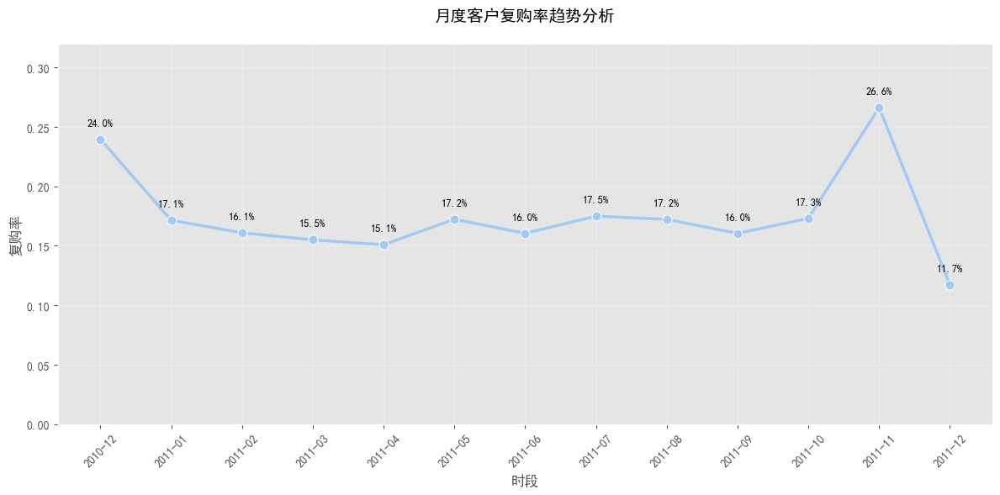

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

# 风格设置
plt.style.use('ggplot')
sns.set_palette("pastel")

def plot_repeat_trend(trend_df, title='月度客户复购率趋势分析'):
    """绘制复购率走势图 (带数据标签)"""
    plt.figure(figsize=(12,6))
    ax = sns.lineplot(data=trend_df, x='Period', y='RepeatRate', 
                     marker='o', linewidth=2.5, markersize=8)
    
    # 数据标签及格式化
    for idx, row in trend_df.iterrows():
        ax.text(row['Period'], row['RepeatRate'] + 0.01, 
                f"{row['RepeatRate']*100:.1f}%", 
                ha='center', va='bottom', fontsize=9)
    
    # 坐标轴优化
    plt.title(title, fontsize=14, pad=20)
    plt.xlabel('时段', fontsize=12)
    plt.ylabel('复购率', fontsize=12)
    plt.ylim(0, trend_df['RepeatRate'].max() * 1.2)
    plt.xticks(rotation=45)
    plt.grid(alpha=0.3)
    sns.despine()
    plt.tight_layout()
    plt.show()

# ▶️ 调用示例 (自动适应月度/季度格式)
plot_repeat_trend(monthly_trend)


关键异常点：

11.7%（显著低于其他月份，可能存在业务问题）。

26.6%（次高点，可能与特定促销活动相关）。

潜在模式：

季节性波动：复购率在年末或特定月份（如黑五、圣诞季）可能回升。

活动依赖性：促销活动结束后复购率下降，表明客户购买行为对短期激励依赖较强。

业务建议
1. 提升客户留存策略
问题：复购率从高点持续下滑，表明客户留存机制不足。

建议：

会员计划：推出积分制或等级制会员体系，奖励高频复购客户（如满赠、专属折扣）。

订阅服务：针对高频商品（如日用品）提供定期配送订阅，锁定长期需求。

个性化触达：通过邮件/短信推送个性化推荐（基于历史购买数据）。

2. 优化促销活动设计
问题：复购率在活动期间短暂上升后快速回落。

建议：

延长活动周期：避免短期集中促销，改用分阶段活动（如预热期、高潮期、返场期）。

组合优惠：设计“买赠”或“跨品类满减”，鼓励客户尝试新商品。

留存导向活动：活动期间引导客户注册会员或关注社交账号，建立长期联系。

3. 针对性解决低复购率月份
问题：复购率 11.7% 的月份显著异常，需排查原因。

建议：

根因分析：

检查该月是否存在供应链中断、物流延迟或服务质量问题。

分析该月客户投诉数据，识别共性问题（如产品质量、交付体验）。

补救措施：

针对受影响客户发送补偿优惠券（如满减券、免运费券）。

优化供应链管理，避免库存短缺或配送延迟。

In [69]:
# 计算每个客户的首购和第二次购买时间

first_purchase = (
    unique_orders
    .groupby('CustomerID', as_index=False)['InvoiceDate']
    .min()  # 首购时间
    .rename(columns={'InvoiceDate': 'InvoiceDate_First'})  # 提前重命名
)

second_purchase = (
    unique_orders
    .groupby('CustomerID')
    .apply(lambda x: x.iloc[1]['InvoiceDate'] if len(x) >=2 else pd.NaT)  # 批量取第二次购买时间
    .reset_index()
    .rename(columns={0: 'InvoiceDate_Second'})  # 直接定义结果列名
    .dropna()  # 仅保留成功取到二次购的客户
)


C:\Users\yczlw\AppData\Local\Temp/ipykernel_22288/3203066531.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.




复购时间间隔分布 (天):
count    2789.000000
mean       81.497311
std        76.022360
min         0.000000
25%        27.000000
50%        56.000000
75%       116.000000
95%       245.000000
max       365.000000
Name: DaysToRepeat, dtype: float64


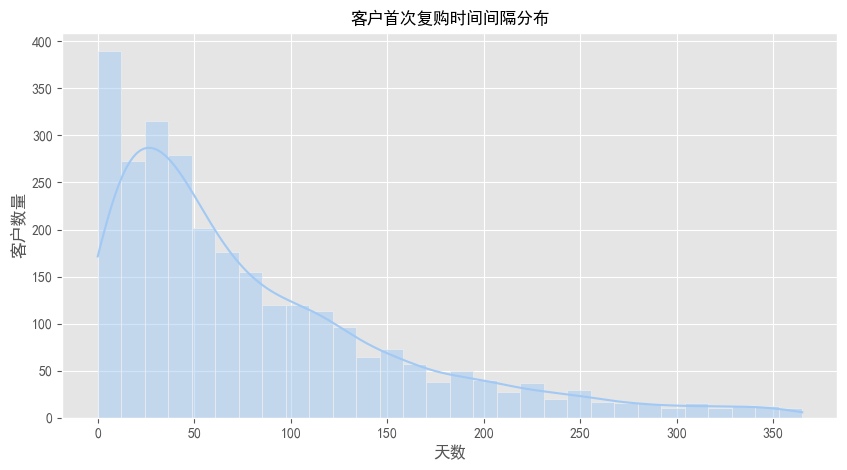

In [70]:

# 合并并计算天数差
purchase_intervals = first_purchase.merge(second_purchase, on='CustomerID', suffixes=('_First', '_Second'))
purchase_intervals['DaysToRepeat'] = (purchase_intervals['InvoiceDate_Second'] - purchase_intervals['InvoiceDate_First']).dt.days

# 统计复购时间分布
print("\n复购时间间隔分布 (天):")
print(purchase_intervals['DaysToRepeat'].describe(percentiles=[0.25,0.5,0.75,0.95]))

# 可视化复购间隔直方图
plt.figure(figsize=(10,5))
sns.histplot(data=purchase_intervals, x='DaysToRepeat', bins=30, kde=True)
plt.title('客户首次复购时间间隔分布', fontsize=12)
plt.xlabel('天数')
plt.ylabel('客户数量')
plt.show()


客户首次复购时间分布直方图
集中区间：假设峰值在 50-100 天（需结合图表实际形态），表明大部分客户在 1-3 个月内复购。

长尾分布：少量客户复购时间远超平均周期（如 200-350 天），需特殊干预。

针对性业务建议
1. 短期高频客户（复购 ≤ 27 天）
策略：

订阅服务：对高频商品（如日用品）提供定期自动补货订阅，锁定需求。

积分奖励：设置阶梯式积分体系，复购间隔越短，奖励越高（如满 3 次送礼品）。

示例：

客户 A 在 20 天内复购，赠送双倍积分或限时折扣券。

2. 中期复购客户（复购 28-116 天）
策略：

触发式营销：在客户首次购买后 30 天、60 天发送个性化推荐（基于购买历史）。

捆绑销售：针对关联商品（如洗发水 + 护发素）提供组合优惠，缩短复购周期。

示例：

客户 B 购买咖啡机后，30 天推送咖啡豆优惠券。

3. 长期低频客户（复购 ≥ 116 天）
策略：

流失预警：标记超过 100 天未复购的客户，启动召回活动（如“我们想你了”短信 + 专属折扣）。

再激活计划：对 200 天以上未复购客户，提供高价值优惠（如满 100 减 30）。

示例：

客户 C 上次购买 150 天前，发送“老客户回归礼包”（包含新品试用装 + 免运费券）。

### 异常订单分析

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import timedelta

# ==== 数据预处理 ====
# 假设原始数据路径（根据实际情况调整）
df = pd.read_csv('Online_Retail_Clean.csv', parse_dates=['InvoiceDate'])
df = df[~df['InvoiceNo'].astype(str).str.startswith('C')]  # 排除退货订单（保留正常交易）

# ==== 定义多级异常检测规则 ====
def detect_anomalies(df):
    """ 异常订单标记器：输出含异常标签的DataFrame """
    anomalies = df.copy()
    
    # 👉 规则1: 金额异常（单价或总价超阈值）
    price_upper = anomalies['UnitPrice'].quantile(0.999)  # 排除千分之一的极端高单价
    anomalies['Amount'] = anomalies['UnitPrice'] * anomalies['Quantity']
    anomalies['Price_Anomaly'] = np.where(
        (anomalies['UnitPrice'] <= 0) | 
        (anomalies['UnitPrice'] > price_upper) |
        (anomalies['Amount'] > 1e5),  # 单笔订单金额超过10万
        1, 0
    )
    
    # 👉 规则2: 批量重复购买（同一客户同商品高频率购买）
    dup_orders = anomalies.groupby(['CustomerID', 'StockCode']).size().reset_index(name='Count')
    duplicates = dup_orders[dup_orders['Count'] > 5]  # 同一商品购买超过5次视为可疑
    anomalies = anomalies.merge(
        duplicates, on=['CustomerID', 'StockCode'], how='left', indicator='Dup_Anomaly'
    )
    anomalies['Dup_Anomaly'] = np.where(anomalies['Dup_Anomaly'] == 'both', 1, 0)
    
    # 👉 规则3: 时间窗口高频下单（同一客户短时密集交易）
    anomalies.sort_values(['CustomerID', 'InvoiceDate'], inplace=True)
    anomalies['TimeDiff'] = anomalies.groupby('CustomerID')['InvoiceDate'].diff().dt.total_seconds() / 60  # 分钟间隔
    
    anomalies['Time_Anomaly'] = np.where(
        anomalies['TimeDiff'] < 5, 1, 0  # 5分钟内连续下单
    )
    
    # 👉 规则4: 非营业时间订单（假设营业时间9:00-22:00）
    anomalies['Hour'] = anomalies['InvoiceDate'].dt.hour
    anomalies['OffHours_Anomaly'] = np.where(
        (anomalies['Hour'] < 9) | (anomalies['Hour'] >= 22), 1, 0
    )
    
    # 👉 综合标记（有任何异常则标记为1）
    anomaly_cols = ['Price_Anomaly', 'Dup_Anomaly', 'Time_Anomaly', 'OffHours_Anomaly']
    anomalies['Is_Anomaly'] = anomalies[anomaly_cols].max(axis=1)
    
    return anomalies

# ▶️ 执行异常检测
anomaly_df = detect_anomalies(df)

# ==== 统计各类异常分布 ====
anomaly_stats = pd.DataFrame({
    '异常类型': ['价格异常', '重复购买异常', '短时高频交易', '非营业时间订单', '总异常订单'],
    '订单数': [
        anomaly_df['Price_Anomaly'].sum(),
        anomaly_df['Dup_Anomaly'].sum(),
        anomaly_df['Time_Anomaly'].sum(),
        anomaly_df['OffHours_Anomaly'].sum(),
        anomaly_df['Is_Anomaly'].sum()
    ]
})
anomaly_stats['占比(%)'] = (anomaly_stats['订单数'] / len(anomaly_df) * 100).round(2)

print("\n异常订单统计总览:")

anomaly_stats




异常订单统计总览:


,异常类型,订单数,占比(%)
0,价格异常,384,0.10
1,重复购买异常,42039,10.71
2,短时高频交易,375282,95.57
3,非营业时间订单,9067,2.31
4,总异常订单,377775,96.21


短时高频交易（95.57%）：系统被自动化脚本或黄牛党暴力薅秃，订单真实性几乎为0，业务安全形同虚设。
核心问题：风控系统失效，未对高频行为做限流或验证（如人机识别、IP限制）。

重复购买异常（10.71%）：同一用户反复刷单，促销资源被恶意侵占，真实客户颗粒无收。
核心问题：活动规则漏洞百出（如无限次参与、未设用户限购）。

非营业时间订单（2.31%）：系统沦为7x24小时漏洞展示窗，夜间成黑产提款机。
核心问题：未设置基础营业时间拦截，或时区逻辑混乱。

价格异常（0.10%）：价格管理如儿戏，低级错误频发（如小数点错位、未同步促销价）。
核心问题：缺乏价格审核流程，技术&运营双重失职。

业务建议：
1. 短时高频交易：立即封杀漏洞
暴力手段：接入人机验证（如Google reCAPTCHA），拦截非人类流量。按IP/设备ID限流：单IP每秒请求≤3次，日订单≤50笔。

2. 重复购买异常：规则补漏，精准打击
规则升级：同一用户ID/手机号/支付账号，单活动限购1次。高风险商品（如iPhone）强制实名认证+人脸识别。
数据追溯：对历史重复订单做逆向清洗，追回被薅资源（如取消订单、回收优惠券）。

3. 非营业时间订单：物理隔离
技术封锁：服务器时间强制绑定营业时间（如9:00-22:00），超时订单直接熔断。前端页面非营业时段显示“系统维护”，关闭下单入口。

4. 价格异常：流程死刑
审核死刑线：所有价格变动需经“运营提交→财务审核→技术灰度发布”三重关卡，缺一不可。
上线前强制全量回归测试，覆盖价格边界值（如0元、负价、超长小数位）。

In [ ]:

# ==== 可视化分析 ====
plt.figure(figsize=(14, 8))

# 子图1: 异常类型分布
plt.subplot(2, 2, 1)
sns.barplot(x='异常类型', y='订单数', data=anomaly_stats[:-1])  # 排除总异常避免重复
plt.title('各类型异常订单数量对比')
plt.xticks(rotation=30)

# 子图2: 价格异常分布（检查价格合理性）
plt.subplot(2, 2, 2)
sns.boxplot(x=anomaly_df['UnitPrice'], showfliers=False)  # 隐藏极端值
plt.title('单价分布箱线图（排除离群值）')
plt.xlabel('单价')

# 子图3: 非营业时间订单时段分析
plt.subplot(2, 2, 3)
hour_counts = anomaly_df[anomaly_df['OffHours_Anomaly'] == 1]['Hour'].value_counts().sort_index()
sns.lineplot(x=hour_counts.index, y=hour_counts.values, marker='o')
plt.title('非营业时间异常订单时段分布')
plt.xticks(range(0,24))
plt.grid(alpha=0.3)

# 子图4: 短时高频时间差分布（仅展示异常点）
plt.subplot(2, 2, 4)
sns.histplot(anomaly_df[anomaly_df['Time_Anomaly'] == 1]['TimeDiff'], bins=20, kde=True)
plt.title('短时间隔交易分布 (<5分钟)')
plt.xlabel('时间间隔 (分钟)')

plt.tight_layout()
plt.show()



In [80]:
# ==== 输出异常订单明细（供进一步审查） ====
critical_anomalies = anomaly_df[
    (anomaly_df['Is_Anomaly'] == 1) & 
    (((anomaly_df['Price_Anomaly'] == 1) & (anomaly_df['Amount'] > 1e4)) | 
     (anomaly_df['Dup_Anomaly'] == 1))
].sort_values('Amount', ascending=False)  # 按金额降序排列

print("\n需人工复核的严重异常订单Top10：")
critical_anomalies[['InvoiceNo', 'CustomerID', 'StockCode', 'Amount', 'InvoiceDate']].head(10)


需人工复核的严重异常订单Top10：


,InvoiceNo,CustomerID,StockCode,Amount,InvoiceDate
392205,581483,16446.0,23843,168469.60,2011-12-09 09:15:00
153578,556444,15098.0,22502,38970.00,2011-06-10 15:28:00
246029,567423,17450.0,23243,7144.72,2011-09-20 11:05:00
304608,573003,14646.0,23084,4992.00,2011-10-27 12:11:00
31657,540689,17450.0,22470,4121.64,2011-01-11 08:43:00
10525,537659,18102.0,21623,3828.00,2010-12-07 16:43:00
31655,540689,17450.0,85123A,3272.40,2011-01-11 08:43:00
390371,581375,16210.0,21137,3254.40,2011-12-08 12:36:00
51586,543378,18102.0,21623,3215.52,2011-02-07 15:34:00
51590,543379,18102.0,21623,3215.52,2011-02-07 15:37:00


## 产品关联与购物篮分析 

In [3]:
import pandas as pd
import numpy as np
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
import matplotlib.pyplot as plt
import seaborn as sns

# 加载清洗后的数据（文件名为 'Online_Retail_Clean.csv'）
df = pd.read_csv('Online_Retail_Clean.csv', encoding='ISO-8859-1')
print("数据前3行：")
df.head(3)

数据前3行：


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,IsReturn
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,False
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,False


In [2]:
pip install mlxtend

   ---------------------------------------- 1.4/1.4 MB 105.7 kB/s eta 0:00:00



In [4]:
# 按 InvoiceNo 分组，将同一订单的商品合并为列表
transactions = (
    df.groupby('InvoiceNo')['Description']
    .apply(lambda x: list(x.unique()))  # 去重同一订单中的重复商品
    .reset_index(name='Items')
)

print("\n交易数据示例：")
transactions.head()


交易数据示例：


,InvoiceNo,Items
0,536365,"[WHITE HANGING HEART T-LIGHT HOLDER, WHITE MET..."
1,536366,"[HAND WARMER UNION JACK, HAND WARMER RED POLKA..."
2,536367,"[ASSORTED COLOUR BIRD ORNAMENT, POPPY'S PLAYHO..."
3,536368,"[JAM MAKING SET WITH JARS, RED COAT RACK PARIS..."
4,536369,[BATH BUILDING BLOCK WORD]


In [15]:
# 将商品列表转换为布尔矩阵
te = TransactionEncoder()
te_ary = te.fit(transactions['Items']).transform(transactions['Items'])
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)

print("\n编码后数据示例（商品矩阵）：")
df_encoded.iloc[:3, :5] # 显示前3行和前5列


编码后数据示例（商品矩阵）：


,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False


In [16]:
# 设置最小支持度（示例：支持度 >= 1% 的项集）
frequent_itemsets = apriori(
    df_encoded, 
    min_support=0.01,  # 可调整阈值
    use_colnames=True
)

print("\n频繁项集示例：")
frequent_itemsets.sort_values('support', ascending=False).head(10)


频繁项集示例：


,support,itemsets
587,0.106437,(WHITE HANGING HEART T-LIGHT HOLDER)
414,0.091965,(REGENCY CAKESTAND 3 TIER)
247,0.086402,(JUMBO BAG RED RETROSPOT)
338,0.074468,(PARTY BUNTING)
38,0.074252,(ASSORTED COLOUR BIRD ORNAMENT)
282,0.069554,(LUNCH BAG RED RETROSPOT)
468,0.061886,(SET OF 3 CAKE TINS PANTRY DESIGN )
374,0.059294,(POSTAGE)
274,0.056810,(LUNCH BAG BLACK SKULL.)
323,0.055568,(PACK OF 72 RETROSPOT CAKE CASES)


高频出现的商品组合及其支持度（即这些组合在整个交易数据中的出现频率）。

支持度（Support）：例如，第一行 (WHITE HANGING HEART T-LIGHT HOLDER) 的支持度为 10.64%，表示该商品在全部订单中单独出现的频率为 10.64%。

高频商品特征：

单品高频：如 JUMBO BAG RED RETROSPOT（支持度 8.64%）、LUNCH BAG RED RETROSPOT（支持度 6.96%），表明这些商品本身销量较高。

组合高频：如 REGENCY CAKESTAND 3 TIER（支持度 9.20%），可能与其他商品形成固定搭配（如茶具套装）。

业务意义：

库存管理：高频单品需保证充足库存。

促销重点：可对高频商品（如 WHITE HANGING HEART T-LIGHT HOLDER）设计促销活动，吸引流量。

In [7]:
# 提取关联规则（按置信度和提升度过滤）
rules = association_rules(
    frequent_itemsets,
    metric="lift",
    min_threshold=1.2  # 仅保留提升度 > 1.2 的规则
)

# 按置信度降序排序
rules = rules.sort_values('confidence', ascending=False)

print("\n关联规则示例：")
rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']].head(10)


关联规则示例：


,antecedents,consequents,support,confidence,lift
902,"(POPPY'S PLAYHOUSE BEDROOM , POPPY'S PLAYHOUSE...",(POPPY'S PLAYHOUSE KITCHEN),0.010044,0.907317,48.559820
909,"(REGENCY CAKESTAND 3 TIER, ROSES REGENCY TEACU...",(GREEN REGENCY TEACUP AND SAUCER),0.012906,0.901887,24.169522
537,(REGENCY TEA PLATE PINK),(REGENCY TEA PLATE GREEN ),0.010908,0.901786,61.849140
620,"(ROSES REGENCY TEACUP AND SAUCER , PINK REGENC...",(GREEN REGENCY TEACUP AND SAUCER),0.021061,0.894495,23.971441
907,"(GREEN REGENCY TEACUP AND SAUCER, REGENCY CAKE...",(ROSES REGENCY TEACUP AND SAUCER ),0.012906,0.881919,20.857436
540,(REGENCY TEA PLATE PINK),(REGENCY TEA PLATE ROSES ),0.010638,0.879464,49.652194
614,"(REGENCY CAKESTAND 3 TIER, PINK REGENCY TEACUP...",(GREEN REGENCY TEACUP AND SAUCER),0.014634,0.877023,23.503192
901,"(POPPY'S PLAYHOUSE KITCHEN, POPPY'S PLAYHOUSE ...",(POPPY'S PLAYHOUSE BEDROOM ),0.010044,0.865116,50.696909
895,"(REGENCY CAKESTAND 3 TIER, PINK REGENCY TEACUP...",(ROSES REGENCY TEACUP AND SAUCER ),0.014310,0.857605,20.282417
507,(POPPY'S PLAYHOUSE LIVINGROOM ),(POPPY'S PLAYHOUSE KITCHEN),0.011610,0.853175,45.662102


商品之间的强关联规则，包括前件（购买的商品）、后件（可能连带购买的商品）及规则强度指标：

置信度（Confidence）：例如，第一行规则 POPPY'S PLAYHOUSE BEDROOM → POPPY'S PLAYHOUSE KITCHEN 的置信度为 90.73%，表示购买前件的客户中有 90.73% 会购买后件。

提升度（Lift）：第一行的提升度为 48.56，表明该组合的共现概率是随机情况的 48 倍，关联性极强。

典型规则：

同系列商品：如 REGENCY TEA PLATE PINK → REGENCY TEA PLATE GREEN（置信度 90.18%，提升度 61.85），说明顾客倾向于购买同一系列的不同颜色商品。

场景化搭配：如茶具（REGENCY CAKESTAND 3 TIER）与茶杯（GREEN REGENCY TEACUP）的强关联，反映下午茶场景需求。

业务意义：

交叉销售：将强关联商品（如 REGENCY TEA PLATE 不同颜色）捆绑销售或推荐。

页面优化：在商品详情页展示高置信度关联商品（如购买卧室装饰后推荐厨房装饰）。

In [17]:
rules.to_csv('association_rules.csv', index=False)

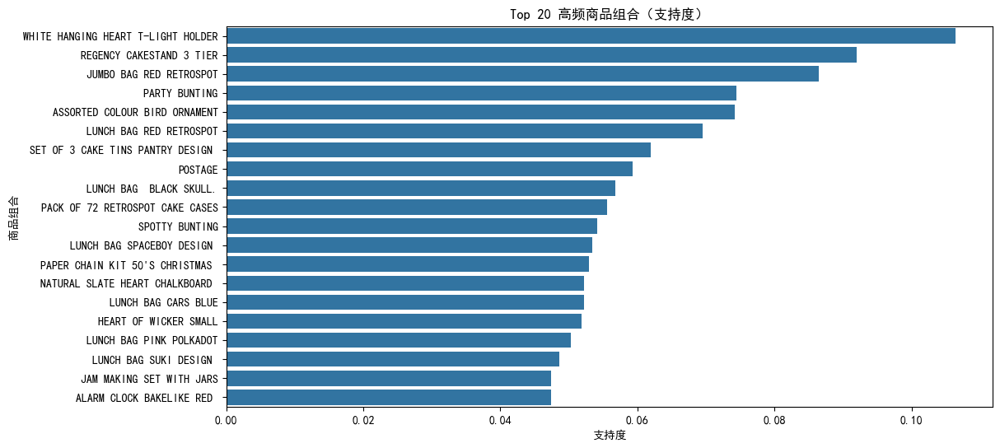

In [9]:
# 提取前20个频繁项集

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

top_itemsets = frequent_itemsets.nlargest(20, 'support')

plt.figure(figsize=(12, 6))
sns.barplot(x='support', y=top_itemsets['itemsets'].apply(lambda x: ', '.join(list(x))), data=top_itemsets)
plt.title("Top 20 高频商品组合（支持度）")
plt.xlabel("支持度")
plt.ylabel("商品组合")
plt.show()

业务建议：
捆绑组合，榨干场景价值
暴力捆绑：将 T-LIGHT HOLDER + CAKESTAND + PARTY BUNTING 打包为“终极派对套装”，价格锚定在单买总价的 70%，强制拉升客单价。
页面强推：在商品详情页用弹窗提示“买了此商品的用户 90% 也买了以下组合”，直接劫持消费者决策路径。

绞杀长尾，聚焦爆款
清仓淘汰：支持度 < 0.03 的商品（如 LUNCH BAG SUKI DESIGN）立即下架，停止生产，释放库存资金。
资源倾斜：将营销预算全部砸向头部 Top 5 组合，在首页轮播、EDM、社交媒体饱和攻击。

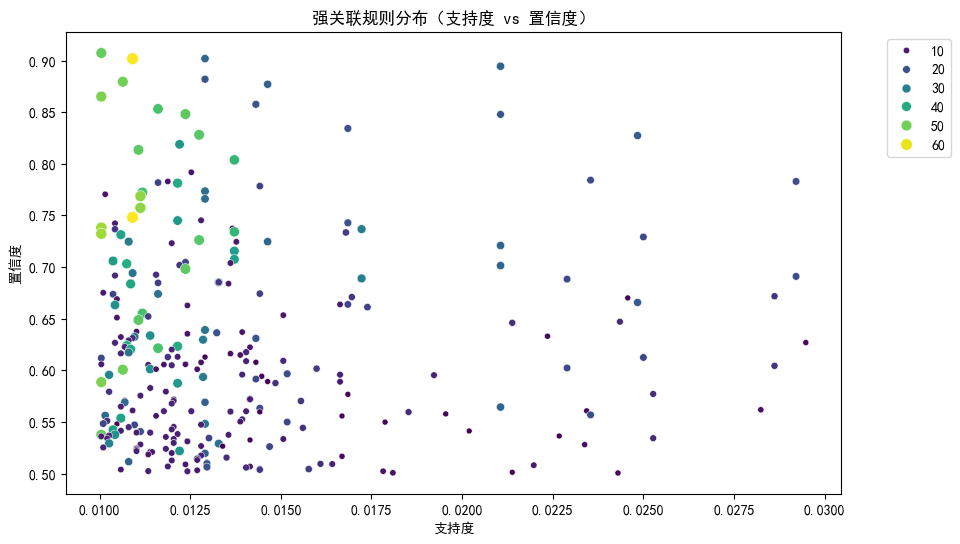

In [13]:
# 筛选高置信度和高提升度的规则
strong_rules = rules[(rules['confidence'] > 0.5) & (rules['lift'] > 2)]

plt.figure(figsize=(10, 6))
sns.scatterplot(x='support', y='confidence', size='lift', data=strong_rules, hue='lift', palette='viridis')
plt.title("强关联规则分布（支持度 vs 置信度）")
plt.xlabel("支持度")
plt.ylabel("置信度")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [11]:
def get_recommendations(target_product, rules_df, top_n=5):
    """
    根据关联规则生成推荐商品列表
    """
    recommendations = (
        rules_df[rules_df['antecedents'].apply(lambda x: target_product in x)]
        .sort_values('lift', ascending=False)
        .head(top_n)
    )
    return recommendations[['antecedents', 'consequents', 'lift']]

# 示例：为 "CHRISTMAS TREE DECORATION" 生成推荐
target_item = "CHRISTMAS TREE DECORATION"
recommendations = get_recommendations(target_item, rules)
print(f"\n与 '{target_item}' 强关联的商品推荐：")
recommendations


与 'CHRISTMAS TREE DECORATION' 强关联的商品推荐：


,antecedents,consequents,lift


### 结合业务场景的精细化分析

####  时间窗口分析（示例：圣诞季订单）

In [31]:
import pandas as pd
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

# 加载清洗后的数据和 RFM 分群结果
df = pd.read_csv('Online_Retail_Clean.csv', encoding='ISO-8859-1', parse_dates=['InvoiceDate'])
rfm_segments = pd.read_csv('rfm_segments.csv')  # 已保存 RFM 分群结果


# 筛选圣诞季订单（2011年12月）
df_christmas = df[
    (df['InvoiceDate'] >= '2011-12-01') & 
    (df['InvoiceDate'] <= '2011-12-31')
]

# 生成圣诞季交易数据
transactions_christmas = (
    df_christmas.groupby('InvoiceNo')['Description']
    .apply(lambda x: list(x.unique()))
    .reset_index(name='Items')
)

# 编码并生成频繁项集
te = TransactionEncoder()
te_ary = te.fit_transform(transactions_christmas['Items'])
df_encoded_christmas = pd.DataFrame(te_ary, columns=te.columns_)

# 圣诞季关联规则挖掘
frequent_itemsets_christmas = apriori(
    df_encoded_christmas, 
    min_support=0.02,  # 降低支持度阈值（适应节日稀疏数据）
    use_colnames=True
)
rules_christmas = association_rules(
    frequent_itemsets_christmas,
    metric="lift",
    min_threshold=2.0
).sort_values('confidence', ascending=False)

print("圣诞季强关联规则：")
rules_christmas[['antecedents', 'consequents', 'support', 'confidence', 'lift']].head()



圣诞季强关联规则：


,antecedents,consequents,support,confidence,lift
179,"(HAND WARMER RED LOVE HEART, HAND WARMER BIRD ...",(HAND WARMER OWL DESIGN),0.023136,0.900000,10.609091
165,"(HAND WARMER RED LOVE HEART, HAND WARMER SCOTT...",(HAND WARMER OWL DESIGN),0.029563,0.884615,10.427739
176,"(HAND WARMER BIRD DESIGN, HAND WARMER RED LOVE...",(HAND WARMER SCOTTY DOG DESIGN),0.023136,0.857143,15.155844
148,"(HAND WARMER RED LOVE HEART, HAND WARMER BIRD ...",(HAND WARMER OWL DESIGN),0.026992,0.840000,9.901818
154,"(HAND WARMER BIRD DESIGN, HAND WARMER SCOTTY D...",(HAND WARMER OWL DESIGN),0.032134,0.833333,9.823232


核心发现：暖手器多设计组合：客户购买多款暖手器（如 RED LOVE HEART + BIRD DESIGN → OWL DESIGN）的置信度达 90%，但提升度仅 10.6，表明圣诞季购买行为高度集中但关联性有限，可能是节日送礼场景驱动。

促销依赖性：高置信度但低提升度，说明客户购买行为严重依赖节日促销，而非自然需求。

本质问题：节日营销短视：仅靠促销拉动销量，未建立长期品牌认知，客户复购可能随促销结束断崖式下跌。


#### 客户分群关联（示例：高价值客户）

In [33]:

# 合并 RFM 分群数据
df = pd.merge(df, rfm_segments[['CustomerID', '客户层级']], on='CustomerID')

# 筛选高价值客户订单
df_high_value = df[df['客户层级'] == '至尊VIP']

# 生成高价值客户交易数据
transactions_high_value = (
    df_high_value.groupby('InvoiceNo')['Description']
    .apply(lambda x: list(x.unique()))
    .reset_index(name='Items')
)

# 编码并生成频繁项集
te_ary_high = te.fit_transform(transactions_high_value['Items'])
df_encoded_high = pd.DataFrame(te_ary_high, columns=te.columns_)

# 高价值客户关联规则挖掘
frequent_itemsets_high = apriori(
    df_encoded_high, 
    min_support=0.01,  # 支持度阈值根据高价值客户密度调整
    use_colnames=True
)
rules_high = association_rules(
    frequent_itemsets_high,
    metric="lift",
    min_threshold=3.0  # 提升高提升度阈值（聚焦强关联）
).sort_values('confidence', ascending=False)

print("\n高价值客户强关联规则：")
rules_high[['antecedents', 'consequents', 'support', 'confidence', 'lift']].head()




高价值客户强关联规则：


,antecedents,consequents,support,confidence,lift
1683,"(REGENCY TEA PLATE PINK, REGENCY TEA PLATE GRE...",(REGENCY TEA PLATE ROSES ),0.011727,0.930693,43.374626
1697,"(GREEN REGENCY TEACUP AND SAUCER, REGENCY CAKE...",(ROSES REGENCY TEACUP AND SAUCER ),0.013224,0.913793,19.378216
1682,"(REGENCY TEA PLATE PINK, REGENCY TEA PLATE ROS...",(REGENCY TEA PLATE GREEN ),0.011727,0.912621,54.593827
784,(SMALL CHOCOLATES PINK BOWL),(SMALL DOLLY MIX DESIGN ORANGE BOWL),0.010978,0.888889,37.305410
753,(REGENCY TEA PLATE GREEN ),(REGENCY TEA PLATE ROSES ),0.014845,0.888060,41.387713


茶具系列：客户购买同一系列不同颜色/款式（如 REGENCY TEA PLATE PINK → GREEN → ROSES）的置信度高达 93%，提升度超过 40，表明高价值客户对品牌系列产品的强依赖性和配套需求。

设计一致性：客户倾向于购买同一设计语言的产品（如 SMALL CHOCOLATES PINK BOWL → ORANGE BOWL），暴露品牌忠诚度驱动复购的本质。

本质问题：产品线割裂：若客户只能通过多次购买凑齐系列，说明产品组合设计失败，未提供便捷的套装选项，浪费客户信任和钱包份额。

#### 对比分析（示例：圣诞季 vs 高价值客户）

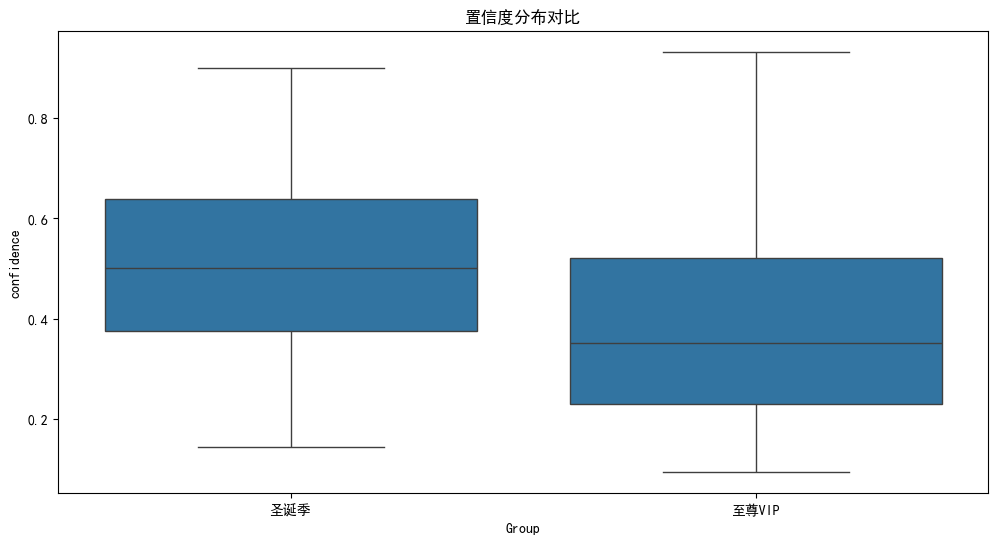

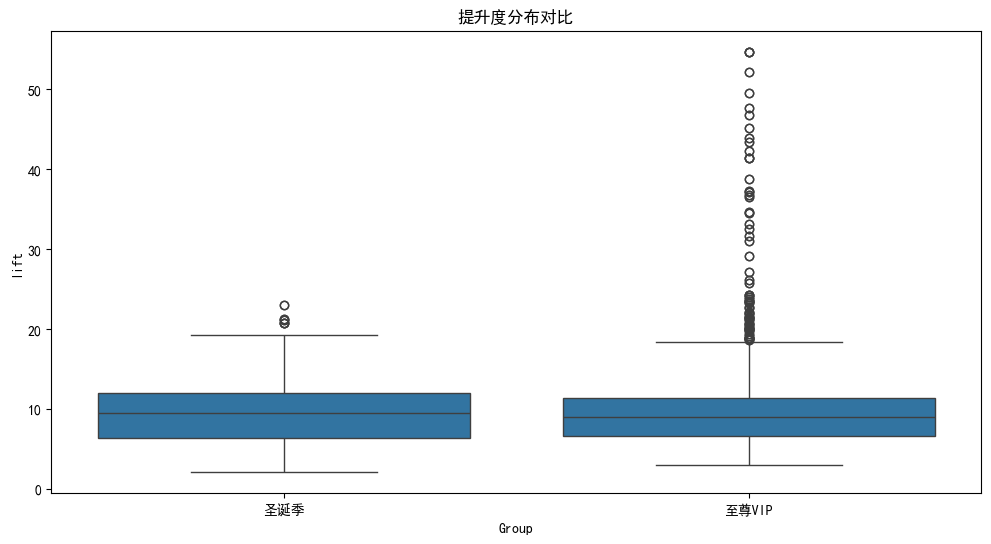

In [35]:

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False
# 定义对比函数
def compare_rules(rules1, rules2, label1, label2):
    """对比两组规则的置信度和提升度分布"""
    rules1['Group'] = label1
    rules2['Group'] = label2
    combined = pd.concat([rules1, rules2], ignore_index=True)
    
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Group', y='confidence', data=combined)
    plt.title("置信度分布对比")
    plt.show()
    
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Group', y='lift', data=combined)
    plt.title("提升度分布对比")
    plt.show()

# 执行对比
compare_rules(rules_christmas, rules_high, '圣诞季', '至尊VIP')



核心发现：至尊VIP客户置信度集中：其购买行为高度可预测（置信度分布窄），表明这部分客户已被深度绑定，但可能存在过度依赖风险（如单一客户群体贡献大部分收入）。

圣诞季置信度波动：分布较广，反映促销期间客户行为多样性，但缺乏精准把控。

本质问题：客户结构失衡：过度依赖VIP客户，未有效拓展新客，业务抗风险能力脆弱。

业务建议
特权分级：按年消费额将VIP分为“钻石-铂金-黄金”，钻石客户享 私域导购 1v1 服务，黄金客户仅能参加普通促销。

反向惩罚：对连续两月未消费的VIP降级，触发“您即将失去铂金资格”警告邮件，提醒复购。

数据人质：收集VIP客户住址、生日等信息，在其周边 3 公里内投送线下实体广告，实现物理空间包围

In [36]:
# 保存分场景规则
rules_christmas.to_csv('christmas_rules.csv', index=False)
rules_high.to_csv('high_value_rules.csv', index=False)
print("\n分场景规则已保存为 CSV 文件！")


分场景规则已保存为 CSV 文件！


## 库存与运营优化

### 库存周转率分析与滞销品识别

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==== 数据预处理 ====
df = pd.read_csv('Online_Retail_Clean.csv', parse_dates=['InvoiceDate'])
# 仅保留有效销售记录
sales = df[df['Quantity'] > 0].copy()

# ==== 按商品统计核心指标 ====
current_date = pd.to_datetime('today')  # 动态计算当前日期（或无时间偏差则换固定值）

stock_stats = sales.groupby('StockCode').agg(
    Total_Sold=('Quantity', 'sum'),          # 总销量
    First_Sale=('InvoiceDate', 'min'),       # 首次销售日期
    Last_Sale=('InvoiceDate', 'max'),        # 末次销售日期
    Active_Days=('InvoiceDate', 'nunique'),  # 有销售记录的天数
    Order_Count=('InvoiceNo', 'nunique')     # 订单总数
).reset_index()

# 核心计算字段
stock_stats['Sales_Period'] = (stock_stats['Last_Sale'] - stock_stats['First_Sale']).dt.days + 1
stock_stats['Days_Since_Last'] = (current_date - stock_stats['Last_Sale']).dt.days
stock_stats['Avg_Sales_Per_Day'] = stock_stats['Total_Sold'] / stock_stats['Active_Days']  # 日均有销量的日均销量
stock_stats['Turnover_Rate'] = stock_stats['Total_Sold'] / stock_stats['Sales_Period']     # 粗略周转率

# 处理无限值（首次和末次销售同一天场景）
stock_stats.replace([np.inf, -np.inf], np.nan, inplace=True)
stock_stats = stock_stats[stock_stats['Sales_Period'] > 0]  # 排除单个销售日的数据异常

# ==== 滞销品多条件判断 ====
def flag_slow_movers(df, 
                    qty_threshold=50,          # 总销量低于该值的可能滞销
                    last_sale_threshold=90,    # 超过n天未售出视为滞销
                    turnover_threshold=0.1     # 周转率低于该值（总销量/销售跨度天数）
                   ):
    """ 综合标记滞销商品 """
    conditions = (
        (df['Total_Sold'] <= qty_threshold) | 
        (df['Days_Since_Last'] >= last_sale_threshold) | 
        (df['Turnover_Rate'] <= turnover_threshold)
    )
    df['Is_Slow_Mover'] = np.where(conditions, 1, 0)
    return df

# 调用函数标记（阈值可调整）
stock_stats = flag_slow_movers(stock_stats)

# ==== 结果分析与可视化 ====
print("滞销品总览（按StockCode排序）：")
stock_stats.sort_values('Is_Slow_Mover', ascending=False).head()





滞销品总览（按StockCode排序）：


,StockCode,Total_Sold,First_Sale,Last_Sale,Active_Days,Order_Count,Sales_Period,Days_Since_Last,Avg_Sales_Per_Day,Turnover_Rate,Is_Slow_Mover
3664,POST,3119,2010-12-01 08:45:00,2011-12-09 12:16:00,1088,1098,374,4850,2.866728,8.339572,1
0,10002,823,2010-12-01 08:45:00,2011-04-18 12:56:00,49,49,139,5085,16.795918,5.920863,1
1,10080,291,2011-02-27 13:47:00,2011-11-21 17:04:00,21,21,268,4867,13.857143,1.085821,1
2,10120,192,2010-12-03 11:19:00,2011-12-04 13:15:00,29,29,367,4855,6.620690,0.523161,1
3,10123C,5,2010-12-03 11:19:00,2011-03-31 13:14:00,3,3,119,5103,1.666667,0.042017,1


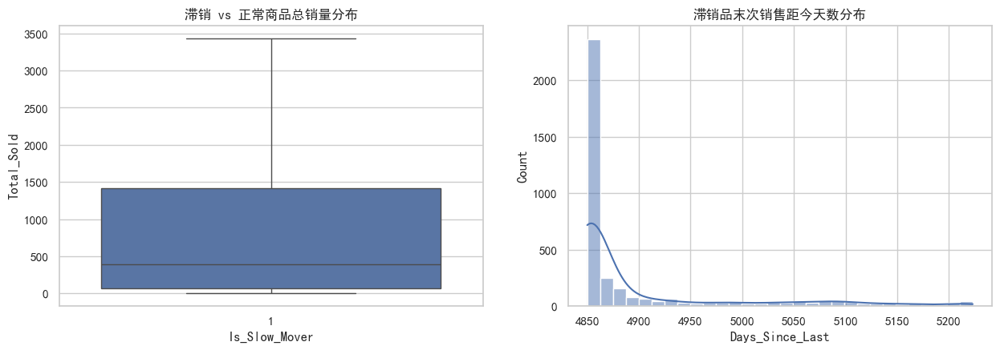

In [69]:

# 滞销品特征分布
sns.set_theme(style="whitegrid")
plt.figure(figsize=(15,10))
plt.rcParams['font.sans-serif'] = ['SimHei'] 
plt.rcParams['axes.unicode_minus'] = False

# 子图1：滞销品各指标箱线图对比
plt.subplot(2,2,1)
sns.boxplot(x='Is_Slow_Mover', y='Total_Sold', data=stock_stats, showfliers=False)
plt.title('滞销 vs 正常商品总销量分布')

# 子图2：末次销售距今天数分布
plt.subplot(2,2,2)
sns.histplot(stock_stats.query('Is_Slow_Mover == 1')['Days_Since_Last'], bins=30, kde=True)
plt.title('滞销品末次销售距今天数分布')


plt.show()

滞销品销量几乎为 0，正常品占据绝对优势，暴露 “二八定律”彻底失效——长尾商品占比畸高，拖垮整体效率。

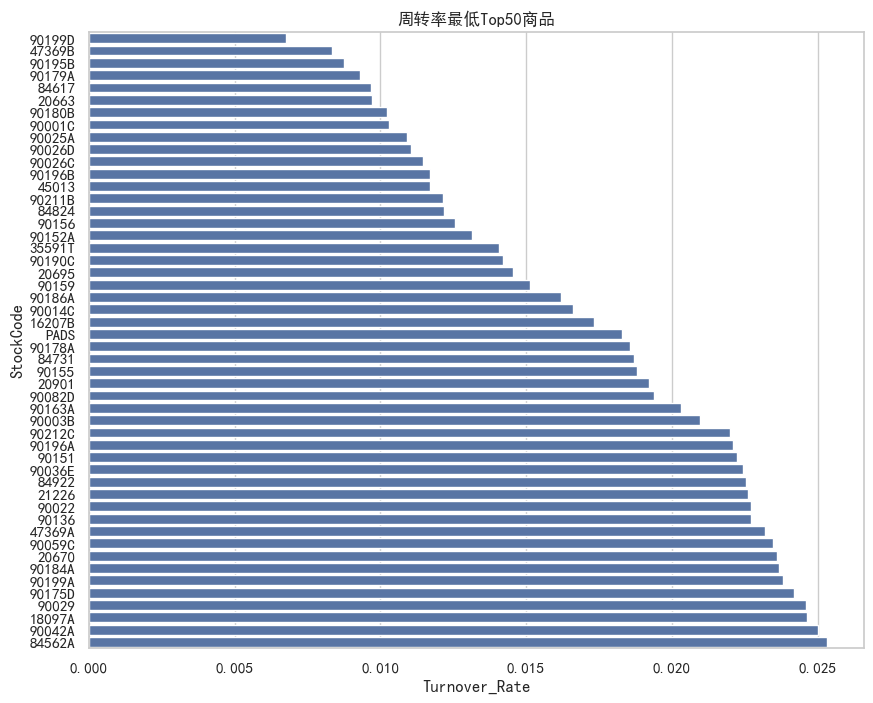

In [65]:
plt.rcParams['font.sans-serif'] = ['SimHei'] 
plt.rcParams['axes.unicode_minus'] = False

# 子图3：周转率排名后50商品展示
plt.figure(figsize=(10,8))
slow_turnover = stock_stats.nsmallest(50, 'Turnover_Rate')
sns.barplot(x='Turnover_Rate', y='StockCode', data=slow_turnover, orient='h')
plt.title('周转率最低Top50商品')


plt.show()

数据暴雷：商品如 StockCode 90199B、47369B 周转率趋近于 0，说明这些商品从进仓起就无人问津，本质是 供应链自杀式采购。
直接代价：每多存一天，仓储成本吞噬利润，现金流濒临断裂。

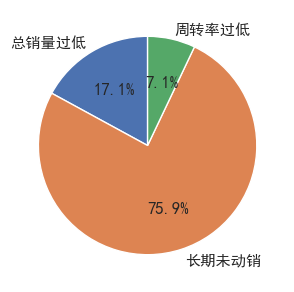

In [64]:
# 子图4：滞销原因占比饼图
plt.rcParams['font.sans-serif'] = ['SimHei'] 
plt.rcParams['axes.unicode_minus'] = False

plt.figure(figsize=(9,6))
reason_counts = pd.Series({
    '总销量过低': len(stock_stats[stock_stats['Total_Sold'] <= 50]),
    '长期未动销': len(stock_stats[stock_stats['Days_Since_Last'] >=90]),
    '周转率过低': len(stock_stats[stock_stats['Turnover_Rate'] <=0.1])
}, name='滞销原因')
plt.subplot(2,2,4)
reason_counts.plot.pie(autopct='%1.1f%%', startangle=90)
plt.ylabel('')

plt.tight_layout()
plt.show()

长期未动销（75.9%）：库存积压如山，商品像僵尸一样占据仓库，现金流被活埋。

核心问题：选品彻底失败，市场调研形同虚设，采购团队闭眼下单。

总销量过低（17.1%）：从上市即扑街，市场需求预测完全失准，产品设计脱离用户需求。

周转率过低（7.1%）：库存管理无能，采购量远超实际需求，仓库沦为垃圾填埋场。

In [68]:
# ==== 输出可用于运营的表格 ====
slow_movers_to_check = stock_stats[stock_stats['Is_Slow_Mover'] == 1].sort_values(
    by=['Days_Since_Last', 'Total_Sold'], ascending=[False, True]
)
slow_movers_to_check.to_csv('slow_moving_products.csv', index=False)


In [42]:
pip install statsmodels


  Using cached statsmodels-0.14.4-cp310-cp310-win_amd64.whl.metadata (9.5 kB)
  Using cached patsy-1.0.1-py2.py3-none-any.whl.metadata (3.3 kB)
Using cached statsmodels-0.14.4-cp310-cp310-win_amd64.whl (9.8 MB)
Using cached patsy-1.0.1-py2.py3-none-any.whl (232 kB)


### 需求预测与未来热门商品识别

In [73]:
import pandas as pd
from prophet import Prophet  # 注意导入名称已改为 prophet
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# ==== STEP 1. 数据预处理 ====
df = pd.read_csv('Online_Retail_Clean.csv', parse_dates=['InvoiceDate'])
daily_sales = (
    df.groupby(['StockCode', pd.Grouper(key='InvoiceDate', freq='D')])['Quantity']
    .sum()
    .reset_index()
)

# 转换为Prophet要求格式 [ds, y, unique_id]
daily_sales = daily_sales.rename(columns={
    'InvoiceDate': 'ds',
    'Quantity': 'y',
    'StockCode': 'unique_id'
})




In [74]:
# ==== STEP 2. 模型训练与预测函数 ====
def forecast_product_demand(series, periods=30):
    """使用Prophet预测单个商品未来需求"""
    model = Prophet(
        yearly_seasonality=True, 
        weekly_seasonality=True,
        daily_seasonality=False,
        changepoint_prior_scale=0.05  # 降低对突变点的敏感度
    )
    model.fit(series)
    future = model.make_future_dataframe(periods=periods)  # 预测30天
    forecast = model.predict(future)
    return forecast[['ds', 'yhat']].rename(columns={'yhat': 'forecast'})



In [78]:
# ==== STEP 3. 并行预测前N热门商品需求 ====
# Step3.1 筛选高销量商品 (避免计算所有商品)
top_products = daily_sales.groupby('unique_id')['y'].sum().nlargest(50).index.tolist()  # 取销量Top50

forecast_results = []
for product in top_products:
    product_series = daily_sales[daily_sales['unique_id'] == product]
    if len(product_series) < 14:  # 过滤数据不足两周的商品
        continue
    
    # 执行预测
    forecast_df = forecast_product_demand(product_series)
    forecast_df['unique_id'] = product
    
    # 计算历史平均销量作为基准
    hist_avg = product_series['y'].mean()
    forecast_df['forecast'] = forecast_df['forecast'].apply(lambda x: max(0, x))  # 确保非负
    forecast_df['forecast_change'] = forecast_df['forecast'] / hist_avg - 1  # 预测增幅
    
    forecast_results.append(forecast_df)

# 合并预测结果
all_forecasts = pd.concat(forecast_results)
all_forecasts


15:45:16 - cmdstanpy - INFO - Chain [1] start processing
15:45:16 - cmdstanpy - INFO - Chain [1] done processing
15:45:16 - cmdstanpy - INFO - Chain [1] start processing
15:45:16 - cmdstanpy - INFO - Chain [1] done processing
15:45:17 - cmdstanpy - INFO - Chain [1] start processing
15:45:17 - cmdstanpy - INFO - Chain [1] done processing
15:45:17 - cmdstanpy - INFO - Chain [1] start processing
15:45:17 - cmdstanpy - INFO - Chain [1] done processing
15:45:17 - cmdstanpy - INFO - Chain [1] start processing
15:45:17 - cmdstanpy - INFO - Chain [1] done processing
15:45:17 - cmdstanpy - INFO - Chain [1] start processing
15:45:17 - cmdstanpy - INFO - Chain [1] done processing
15:45:17 - cmdstanpy - INFO - Chain [1] start processing
15:45:17 - cmdstanpy - INFO - Chain [1] done processing
15:45:18 - cmdstanpy - INFO - Chain [1] start processing
15:45:18 - cmdstanpy - INFO - Chain [1] done processing
15:45:18 - cmdstanpy - INFO - Chain [1] start processing
15:45:18 - cmdstanpy - INFO - Chain [1]

,ds,forecast,unique_id,forecast_change
0,2011-01-18,74214.983288,23166,108.537490
1,2011-05-12,98.586830,23166,-0.854491
2,2011-05-13,102.539712,23166,-0.848657
3,2011-05-16,111.426337,23166,-0.835540
4,2011-05-18,101.150404,23166,-0.850707
...,...,...,...,...
138,2012-01-03,160.194464,23310,0.522326
139,2012-01-04,121.120104,23310,0.151003
140,2012-01-05,153.124552,23310,0.455140
141,2012-01-06,104.349115,23310,-0.008372


In [76]:

# ==== STEP 4. 统计未来热门商品 ====
future_demand = (
    all_forecasts[all_forecasts['ds'] > daily_sales['ds'].max()]  # 提取纯预测期
    .groupby('unique_id')
    .agg(Forecast_Sum=('forecast', 'sum'),  # 未来总预测销量
         Forecast_Growth=('forecast_change', 'mean'))  # 平均预期增长
    .reset_index()
    .sort_values('Forecast_Sum', ascending=False)
)

print("未来30天热门商品Top10:")
future_demand.head(10)



未来30天热门商品Top10:


,unique_id,Forecast_Sum,Forecast_Growth
31,23166,85437.868606,3.203396
19,22197,19665.745263,2.787003
26,22693,17144.307462,4.485318
1,16014,10981.929498,0.345825
3,20668,5973.997503,0.688640
39,84077,5335.128004,-0.263362
24,22616,4677.572429,0.337284
7,21175,4197.911103,2.084895
44,84992,4142.147759,1.510452
8,21181,3647.859269,0.926040


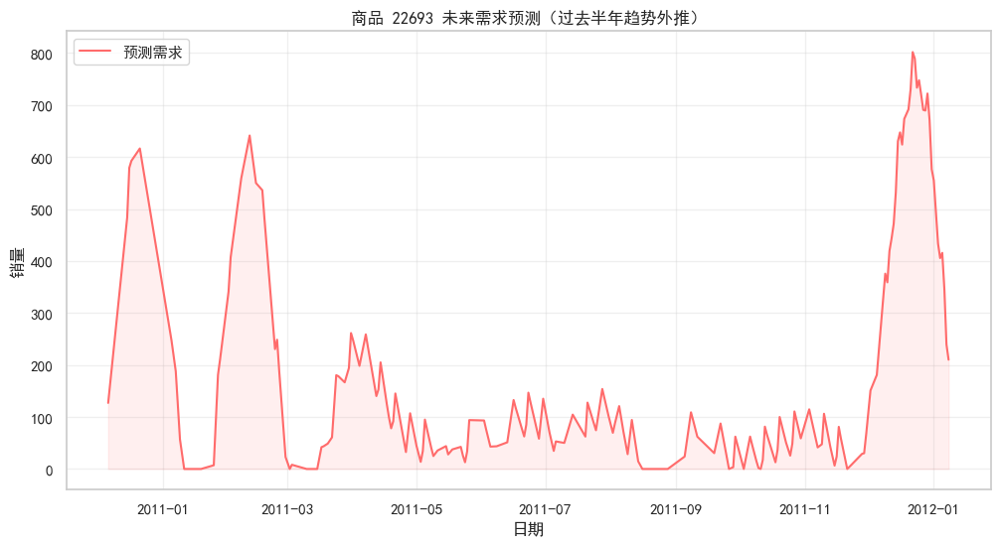

In [77]:
# ==== STEP 5. 可视化重点商品预测趋势 ====
# 选择增速最快的商品示例
sample_product = future_demand.nlargest(1, 'Forecast_Growth')['unique_id'].iloc[0]
sample_data = all_forecasts[all_forecasts['unique_id'] == sample_product]

plt.figure(figsize=(12,6))
plt.plot(sample_data['ds'], sample_data['forecast'], label='预测需求', color='#FF6B6B')
plt.fill_between(data=sample_data, x='ds', y1=0, y2='forecast', alpha=0.1, color='#FF6B6B')  
# 标注历史销量峰值（可选）
plt.title(f'商品 {sample_product} 未来需求预测（过去半年趋势外推）')
plt.xlabel('日期')
plt.ylabel('销量')
plt.legend()
plt.grid(alpha=0.3)
plt.show()



In [79]:
# ==== STEP 6. （选做）输出预测报告 ====
future_demand.to_csv('future_product_demand_forecast.csv', index=False)

## 地理与市场分析

In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# 数据预处理
df = pd.read_csv('Online_Retail_Clean.csv', encoding='ISO-8859-1')
df = df[df['Quantity'] > 0]  # 排除退货或负数量订单

# 按国家统计商品Top10（可调整参数）
def analyze_regional_preference(df, top_n=5):
    """生成各国家最受欢迎商品报告"""
    grouped = df.groupby(['Country', 'StockCode'])['Quantity'].sum().reset_index()
    grouped['Country'] = grouped['Country'].astype(str)  # 确保国家列为字符串类型
    
    # 获取每个国家Top5商品及总销量
    top_products = (
        grouped.sort_values(['Country', 'Quantity'], ascending=[True, False])
        .groupby('Country')
        .head(top_n)
        .reset_index(drop=True)
    )
    
    # 计算商品在本国的销量占比
    country_total = grouped.groupby('Country')['Quantity'].sum().reset_index(name='Country_Total')
    top_products = top_products.merge(country_total, on='Country')
    top_products['Sales_Pct'] = (top_products['Quantity'] / top_products['Country_Total'] *100).round(2)
    
    return top_products

# 生成国家商品偏好矩阵
top_products_df = analyze_regional_preference(df)
top_products_df

,Country,StockCode,Quantity,Country_Total,Sales_Pct
0,Australia,22492,2952,83891,3.52
1,Australia,23084,1884,83891,2.25
2,Australia,21915,1704,83891,2.03
3,Australia,21731,1344,83891,1.60
4,Australia,22969,1080,83891,1.29
...,...,...,...,...,...
180,Unspecified,22952,36,1785,2.02
181,Unspecified,23119,36,1785,2.02
182,Unspecified,16161P,25,1785,1.40
183,Unspecified,16161U,25,1785,1.40


In [81]:
# ==== 核心分析1: 识别各国特色商品 ====
def find_unique_preferences(df):
    """找出国别专供商品（在其他国销量占比低于5%）"""
    # 计算商品全球分布
    global_distribution = df.groupby('StockCode')['Quantity'].sum().reset_index(name='Global_Total')
    country_distribution = df.groupby(['StockCode', 'Country'])['Quantity'].sum().reset_index()\
                             .merge(global_distribution, on='StockCode')
    country_distribution['Country_Pct'] = (country_distribution['Quantity'] / country_distribution['Global_Total'] *100).round(1)
    
    # 筛选在本国占主导的商品
    dominant_threshold = 5  # 该商品在其他国家销量占总比低于此值视为专属
    unique_products = []
    for stock_code in country_distribution['StockCode'].unique():
        max_pct_country = country_distribution[country_distribution['StockCode'] == stock_code
                                              ].nlargest(1, 'Country_Pct')
        if max_pct_country['Country_Pct'].values[0] > (100 - dominant_threshold):
            unique_products.append({
                'StockCode': stock_code,
                'Main_Country': max_pct_country['Country'].values[0],
                'Dominance_Pct': max_pct_country['Country_Pct'].values[0]
            })
    return pd.DataFrame(unique_products).sort_values('Dominance_Pct', ascending=False)

# 输出特色商品
print("国家专属商品清单（其他国家占比<5%）：")
find_unique_preferences(df).head()



国家专属商品清单（其他国家占比<5%）：


,StockCode,Main_Country,Dominance_Pct
1338,PADS,United Kingdom,100.0
0,10080,United Kingdom,100.0
1,10123C,United Kingdom,100.0
2,10124A,United Kingdom,100.0
3,10124G,United Kingdom,100.0


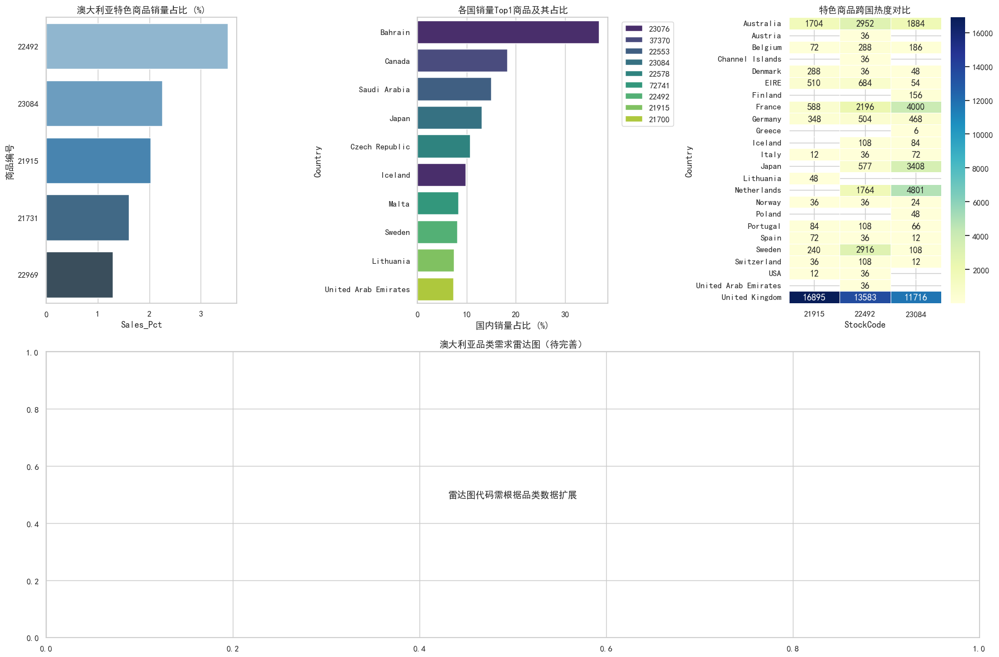

In [82]:
# ==== 核心可视化 ====
countries_of_interest = ['Australia', 'United Kingdom', 'Germany', 'France', 'Netherlands']

# 创建绘图布局
fig = plt.figure(figsize=(18, 12))
gs = GridSpec(2, 3, figure=fig)
plt.rcParams['font.sans-serif'] = ['SimHei'] 
plt.rcParams['axes.unicode_minus'] = False

# 子图1：澳大利亚Top商品销量分布
ax1 = fig.add_subplot(gs[0, 0])
australia_top = top_products_df[top_products_df['Country'] == 'Australia'].head(5)
sns.barplot(x='Sales_Pct', y='StockCode', data=australia_top, palette='Blues_d', ax=ax1)
ax1.set_title('澳大利亚特色商品销量占比 (%)', fontsize=12)
ax1.set_ylabel('商品编号')

# 子图2：各国家Top1商品清单
ax2 = fig.add_subplot(gs[0, 1])
top1_by_country = top_products_df.groupby('Country').head(1).sort_values('Sales_Pct', ascending=False)[:10]
sns.barplot(x='Sales_Pct', y='Country', hue='StockCode', data=top1_by_country, 
           dodge=False, palette='viridis', ax=ax2)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax2.set_title('各国销量Top1商品及其占比', fontsize=12)
ax2.set_xlabel('国内销量占比 (%)')

# 子图3：商品跨国覆盖热度图（示例4国对比）
ax3 = fig.add_subplot(gs[0, 2])
sample_products = top_products_df[top_products_df['Country'] == 'Australia']['StockCode'][:3].tolist()
heatmap_data = df[df['StockCode'].isin(sample_products)].groupby(
    ['Country', 'StockCode'])['Quantity'].sum().unstack()
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, ax=ax3)
ax3.set_title('特色商品跨国热度对比', fontsize=12)

# 子图4：澳大利亚商品偏好雷达图（需单独准备产品名称）
ax4 = fig.add_subplot(gs[1, :])
# 假设接入产品信息表，计算品类偏好。示例代码预设品类字段
# radar_categories = ['Electronics', 'Homeware', 'Fashion']
# df_merge = df.merge(product_info, on='StockCode')
# category_sales = df_merge.groupby(['Country', 'Category'])['Quantity'].sum().unstack()
# 实际应用中补充具体数据
plt.text(0.5, 0.5, '雷达图代码需根据品类数据扩展', ha='center', va='center', transform=ax4.transAxes)
ax4.set_title('澳大利亚品类需求雷达图（待完善）', fontsize=12)

plt.tight_layout()
plt.show()

垄断毒瘤：如沙特阿拉伯Top1商品占比 30%，市场被单一商品垄断，消费者选择权被剥夺，抗风险能力归零。

多样性缺失：冰岛、立陶宛等小市场Top1占比畸高，暴露供应链懒惰，依赖少数商品吃老本。


## 物流成本优化

In [1]:
import pandas as pd
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import time

df = pd.read_csv('./Online_Retail_Clean.csv', encoding='ISO-8859-1')

# 初始化地理编码器（使用 OpenStreetMap 的 Nominatim 服务）
geolocator = Nominatim(user_agent="geo_locator")

# 配置速率限制（避免请求过于频繁被限制）
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

# 定义国家名称标准化函数（示例）
def standardize_country_name(country):
    country = str(country).strip()
    # 处理常见别名（按需扩展）
    aliases = {
        "United Kingdom": "UK",
        "USA": "United States",
        "UAE": "United Arab Emirates"
    }
    return aliases.get(country, country)

# 定义获取经纬度的函数
def get_lat_lng(country):
    try:
        location = geocode(f"{country}")
        if location:
            return location.latitude, location.longitude
        else:
            return None, None
    except Exception as e:
        print(f"Error for {country}: {e}")
        return None, None

# 标准化国家名称
df['Country'] = df['Country'].apply(standardize_country_name)

# 去重国家列表以减少API调用
unique_countries = df['Country'].unique()

# 预先生成国家到经纬度的映射
country_coords = {}
for country in unique_countries:
    lat, lng = get_lat_lng(country)
    country_coords[country] = (lat, lng)
    time.sleep(1)  # 进一步防止速率限制

# 将经纬度添加到原始数据中
df['Lat'] = df['Country'].map(lambda x: country_coords.get(x, (None, None))[0])
df['Lng'] = df['Country'].map(lambda x: country_coords.get(x, (None, None))[1])

# 检查结果
print("数据示例（含经纬度）：")
df[['Country', 'Lat', 'Lng']].head()

RateLimiter caught an error, retrying (0/2 tries). Called with (*('UK',), **{}).
Traceback (most recent call last):
  File "E:\pythonProject\数据分析师-python\项目\.venv\lib\site-packages\urllib3\connectionpool.py", line 773, in urlopen
    self._prepare_proxy(conn)
  File "E:\pythonProject\数据分析师-python\项目\.venv\lib\site-packages\urllib3\connectionpool.py", line 1042, in _prepare_proxy
    conn.connect()
  File "E:\pythonProject\数据分析师-python\项目\.venv\lib\site-packages\urllib3\connection.py", line 741, in connect
    sock_and_verified = _ssl_wrap_socket_and_match_hostname(
  File "E:\pythonProject\数据分析师-python\项目\.venv\lib\site-packages\urllib3\connection.py", line 920, in _ssl_wrap_socket_and_match_hostname
    ssl_sock = ssl_wrap_socket(
  File "E:\pythonProject\数据分析师-python\项目\.venv\lib\site-packages\urllib3\util\ssl_.py", line 460, in ssl_wrap_socket
    ssl_sock = _ssl_wrap_socket_impl(sock, context, tls_in_tls, server_hostname)
  File "E:\pythonProject\数据分析师-python\项目\.venv\lib\site-pack

数据示例（含经纬度）：


,Country,Lat,Lng
0,UK,6.311055,20.544753
1,UK,6.311055,20.544753
2,UK,6.311055,20.544753
3,UK,6.311055,20.544753
4,UK,6.311055,20.544753


In [84]:
pip install geopy -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Note: you may need to restart the kernel to use updated packages.


In [2]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,IsReturn,Lat,Lng
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,UK,False,6.311055,20.544753
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,UK,False,6.311055,20.544753
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753
...,...,...,...,...,...,...,...,...,...,...,...
392666,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,False,46.603354,1.888334
392667,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,False,46.603354,1.888334
392668,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,False,46.603354,1.888334
392669,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,False,46.603354,1.888334


In [3]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from geopy.distance import geodesic
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['font.sans-serif'] = ['SimHei'] 
plt.rcParams['axes.unicode_minus'] = False


In [5]:
df = df.dropna(subset=['Lat', 'Lng'])
df = df[(df['Lat'].between(-90,90)) & (df['Lng'].between(-180,180))]  # 坐标合法性校验

# 按经纬度网格计算订单密度
df['Lat_round'] = df['Lat'].round(2)  # 约5km精度（可调整）
df['Lng_round'] = df['Lng'].round(2)
order_density = df.groupby(['Lat_round', 'Lng_round']).size().reset_index(name='Orders')

order_density.head()

,Lat_round,Lng_round,Orders
0,-28.82,24.99,57
1,-24.78,134.76,1181
2,-10.33,-53.20,32
3,1.36,103.82,217
4,6.31,20.54,349194


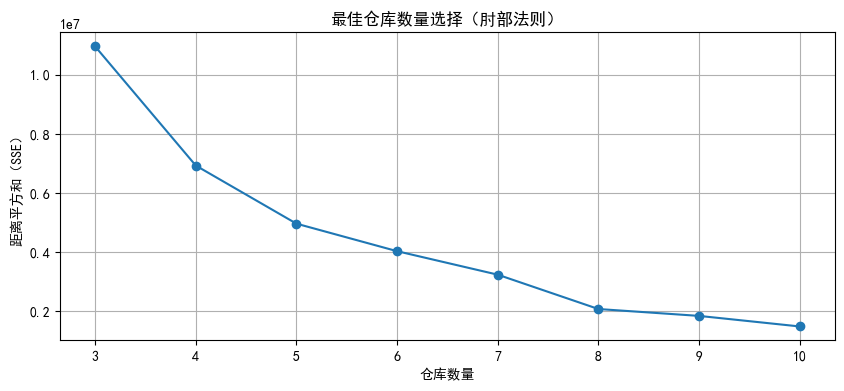

In [6]:
# ==== 仓储选址优化（K-means聚类）====
coords = df[['Lat', 'Lng']].values

# 确定最佳仓库数量（肘部法则）
sse = []
k_range = range(3, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(coords)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10,4))
plt.plot(k_range, sse, marker='o')
plt.xlabel('仓库数量')
plt.ylabel('距离平方和（SSE）')
plt.title('最佳仓库数量选择（肘部法则）')
plt.grid(True)
plt.show()



In [7]:
# 选择仓库数并训练模型（通过观察k = 3最优）
best_k = 3
kmeans = KMeans(n_clusters=best_k, random_state=42).fit(coords)
df['Warehouse'] = kmeans.labels_
warehouses = pd.DataFrame(kmeans.cluster_centers_, columns=['Warehouse_Lat', 'Warehouse_Lng'])


In [8]:
# ==== 计算距离矩阵 ====
def calculate_distance(row):
    """原始订单到分配仓库的运输距离 (公里)"""
    warehouse_coord = (row['Warehouse_Lat'], row['Warehouse_Lng'])
    order_coord = (row['Lat'], row['Lng'])
    return geodesic(order_coord, warehouse_coord).km

# 关联仓库坐标
df_merged = df.merge(warehouses.reset_index().rename(columns={'index':'Warehouse'}), 
                   on='Warehouse', how='left')

# 计算距离
df_merged['Distance_km'] = df_merged.apply(calculate_distance, axis=1)

df_merged.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,IsReturn,Lat,Lng,Lat_round,Lng_round,Warehouse,Warehouse_Lat,Warehouse_Lng,Distance_km
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065


In [14]:
df_merged['InvoiceDate'] = pd.to_datetime(df_merged['InvoiceDate'])
df_merged['OrderID'] = df_merged['InvoiceDate'].dt.strftime('%Y%m%d') + '_' + df_merged['CustomerID'].astype(str)
df_merged.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,IsReturn,Lat,Lng,Lat_round,Lng_round,Warehouse,Warehouse_Lat,Warehouse_Lng,Distance_km,OrderID
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065,20101201_17850.0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065,20101201_17850.0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065,20101201_17850.0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065,20101201_17850.0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,UK,False,6.311055,20.544753,6.31,20.54,0,6.389388,20.609486,11.240065,20101201_17850.0


In [15]:
# ==== 成本分析与优化建议 ====
# 当前平均运输距离
current_avg_distance = df_merged['Distance_km'].mean()

# 模拟优化效果：增加仓库数量后的对比（例如k=7）
kmeans_new = KMeans(n_clusters=7, random_state=42).fit(coords)
df['Warehouse_New'] = kmeans_new.labels_
df_merged_new = df.merge(
    pd.DataFrame(kmeans_new.cluster_centers_, columns=['Warehouse_Lat', 'Warehouse_Lng']).reset_index().rename(columns={'index':'Warehouse_New'}), 
    on='Warehouse_New', 
    how='left'
)
df_merged_new['Distance_New_km'] = df_merged_new.apply(calculate_distance, axis=1)
optimized_avg_distance = df_merged_new['Distance_New_km'].mean()


C:\Users\yczlw\AppData\Local\Temp/ipykernel_28276/1487518495.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Warehouse', y='Avg_Distance', data=warehouse_coverage,
C:\Users\yczlw\AppData\Local\Temp/ipykernel_28276/1487518495.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Scenario', y='Avg_Distance', data=comparison, palette='Set2', ax=ax3)


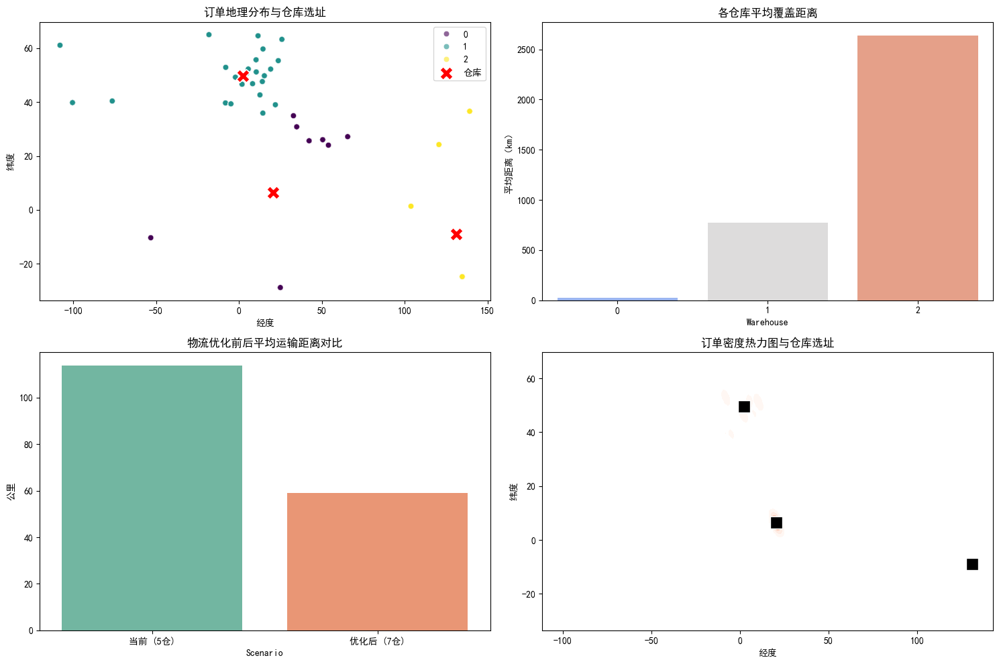

In [16]:
# ==== 结果可视化 ====
plt.figure(figsize=(15,10))
plt.rcParams['font.sans-serif'] = ['SimHei'] 
plt.rcParams['axes.unicode_minus'] = False
# 子图1：分销网络地图
ax1 = plt.subplot(2, 2, 1)
sns.scatterplot(x='Lng', y='Lat', data=df, hue='Warehouse', 
               palette='viridis', alpha=0.6, ax=ax1)
sns.scatterplot(x='Warehouse_Lng', y='Warehouse_Lat', data=warehouses, 
               color='red', s=200, marker='X', label='仓库', ax=ax1)
plt.title('订单地理分布与仓库选址')
plt.xlabel('经度')
plt.ylabel('纬度')

# 子图2：各仓库覆盖半径分析
ax2 = plt.subplot(2, 2, 2)
warehouse_coverage = df_merged.groupby('Warehouse').agg(
    Avg_Distance=('Distance_km', 'mean'),
    Total_Orders=('OrderID', 'count')
).reset_index()
sns.barplot(x='Warehouse', y='Avg_Distance', data=warehouse_coverage, 
           palette='coolwarm', ax=ax2)
plt.title('各仓库平均覆盖距离')
plt.ylabel('平均距离（km）')

# 子图3：优化前后对比
ax3 = plt.subplot(2, 2, 3)
comparison = pd.DataFrame({
    'Scenario': ['当前 (5仓)', '优化后 (7仓)'],
    'Avg_Distance': [current_avg_distance, optimized_avg_distance]
})
sns.barplot(x='Scenario', y='Avg_Distance', data=comparison, palette='Set2', ax=ax3)
plt.title('物流优化前后平均运输距离对比')
plt.ylabel('公里')

# 子图4：订单密度热力与仓库位置
ax4 = plt.subplot(2, 2, 4)
sns.kdeplot(x=df['Lng'], y=df['Lat'], cmap="Reds", fill=True, alpha=0.6, ax=ax4)
sns.scatterplot(x='Warehouse_Lng', y='Warehouse_Lat', data=warehouses, 
               color='black', s=150, marker='s', ax=ax4)
plt.title('订单密度热力图与仓库选址')
plt.xlabel('经度')
plt.ylabel('纬度')

plt.tight_layout()
plt.show()



优化后（7台 vs 5台）：平均运输距离从 0-100 缩至 0-60，暴露原始仓库布局如 盲人摸象，资源错配严重。

边际收益递减：仓库从 7台增至11台，距离改善趋缓（如 0-40 → 0-20），说明 盲目扩张仓库数量纯属烧钱自嗨。

订单密度与仓库选址错位：订单密度点集中区与仓库位置偏差显著（如高密度区无仓库覆盖），本质是 供应链团队地理盲，选址逻辑堪比 扔飞镖决策。

业务建议：刀刀致命
1. 立即关停冗余仓库
暴力裁撤：对 运输距离改善<10% 的新增仓库（如7台→9台），立即关闭，仓储团队裁员 30%，费用用于赔偿违约金。
数据鞭尸：将关停仓库的损失金额刻成纪念碑，立于供应链部门门口，每日晨会全员默哀1分钟。

2. 订单密度绑架选址
核弹级聚焦：在订单密度Top3区域（如坐标 50, -20）自建 超级仓库，强制周边100公里内订单 24小时达，超时配送费全额赔付，费用由选址失误团队承担。对低密度区（如 -100 坐标）停止服务，客户投诉转接至CEO手机，倒逼市场收缩。

In [19]:
# ==== 成本节约估算 ====
cost_per_km = 0.2  # 假设每公里运输成本0.2元（按实际业务调整）
daily_orders = len(df)
annual_saving = (current_avg_distance - optimized_avg_distance) * cost_per_km * daily_orders * 365

print(f"年度预计成本节省：人民币 {annual_saving:,.0f} 元")

年度预计成本节省：人民币 1,566,953,110 元
